# Load Data

In [ ]:
#Allow to print multiple outputs at once
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from dateutil.parser import parse

In [ ]:
#Call basic libraries needed to perform tasks
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Load Dataset 1

In [ ]:
#Upload the first dataset file
from google.colab import files
uploaded = files.upload()

Saving train_transaction.csv to train_transaction.csv


In [ ]:
#Read the first dataset and store into a dataframe
train_transaction = pd.read_csv('train_transaction.csv')

print('First few records of the training transaction file')
train_transaction.head()

print('Number of records in the training transaction set: ', len(train_transaction))

First few records of the training transaction file


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



Number of records in the training transaction set:  590540


### Load Dataset 2

In [ ]:
#Upload the second dataset
from google.colab import files
uploaded = files.upload()

Saving train_identity.csv to train_identity.csv


In [ ]:
#Read the second dataset and store into a dataframe
train_identity = pd.read_csv('train_identity.csv')
print('First few records of the train identity file')
train_identity.head()
print()
print('Number of records in the training identity set ', len(train_identity))

First few records of the train identity file


,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS



Number of records in the training identity set  144233


### Merge Data

In [ ]:
#Merge the two datasets
train_df = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')

In [ ]:
#Print first few records of the merged dataset
print('First few records of the train dataset')
train_df.head()

#Print the length of the merged dataset
print('Number of records in the training dataframe ', len(train_df))

First few records of the train dataset


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M



Number of records in the training dataframe  590540


In [ ]:
#Check number of unique values in each column
nunique_values  = train_df.nunique()

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the missing values
print(nunique_values)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


TransactionID     590540
isFraud                2
TransactionDT     573349
TransactionAmt     20902
ProductCD              5
                   ...  
id_36                  2
id_37                  2
id_38                  2
DeviceType             2
DeviceInfo          1786
Length: 434, dtype: int64

### Count Missing Values

In [ ]:
#Count missing values
missing_values  = train_df.isnull().sum()

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the missing values
print(missing_values)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


TransactionID          0
isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               8933
card3               1565
card4               1577
card5               4259
card6               1571
addr1              65706
addr2              65706
dist1             352271
dist2             552913
P_emaildomain      94456
R_emaildomain     453249
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                  1269
D2                280797
D3                262878
D4                168922
D5                309841
D6                517353
D7                551623
D8                515614
D9                515614


### Drop unneccessary features

As most of the columns are encoded and their true nature is not revealed in the publicly available dataset, following features are dropped due to having a vast number of unexplainable features makes it difficult to explain fraud forecasting.

In [ ]:
train_df = train_df.drop(columns=['TransactionID','card1','ProductCD','TransactionDT','R_emaildomain', 'P_emaildomain', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9','V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29',
 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62',
 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95',
 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125',
 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154',
 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183',
 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212',
 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241',
 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270',
 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299',
 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328',
 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339','id_01','id_02','id_03','id_04','id_05','id_06','id_07','id_08','id_09','id_10','id_11','id_12','id_13','id_14','id_15','id_16','id_17','id_18',
 'id_19','id_20','id_21','id_22','id_23','id_24','id_25','id_26','id_27','id_28','id_29','id_30', 'id_31','id_32','id_33','id_34','id_35','id_36','id_37','id_38', 'DeviceType', 'DeviceInfo'], axis=1)

In [ ]:
train_df.shape

(590540, 48)

In [ ]:
#Count missing values after dropping above features
missing_values  = train_df.isnull().sum()

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the missing values
print(missing_values)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


isFraud                0
TransactionAmt         0
card2               8933
card3               1565
card4               1577
card5               4259
card6               1571
addr1              65706
addr2              65706
dist1             352271
dist2             552913
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                  1269
D2                280797
D3                262878
D4                168922
D5                309841
D6                517353
D7                551623
D8                515614
D9                515614
D10                76022
D11               279287
D12               525823
D13               528588
D14               528353
D15                89113


# Base Dataset Data Analysis

In this section, the original dataset with narrowed down features is analysed.

In [ ]:
numerical_features = ["TransactionAmt", "dist1","C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14", "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12",
                      "D13", "D14", "D15", "V1", "V2", "V3", "V4", "V5", "V6"]
binary_features = ["M1", "M2"]
cat_features = ["ProductCD", "card1", "card2", "card3","card4","card5","card6", "addr1", "addr2"]

## Analyze Target Variable

In [ ]:
fraud_counts = train_df['isFraud'].value_counts()

# Display the counts of fraudulent and normal transactions
#'0' represent normal transactions while '1' represent fraud transactions.
print(fraud_counts)

0    569877
1     20663
Name: isFraud, dtype: int64


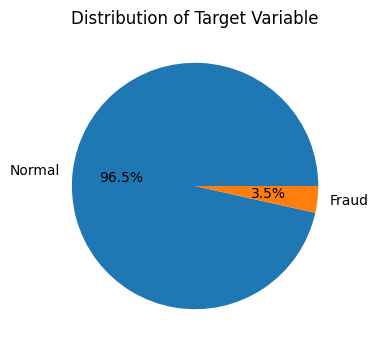

In [ ]:
#Plot the percentage of target variable in a pie chart
plt.figure(figsize=(4, 4))
labels = ['Normal', 'Fraud']
plt.pie(fraud_counts.values, labels=labels, autopct='%1.1f%%')
plt.title('Distribution of Target Variable')
plt.show();

## Descriptive Statistics

First the basic statistics for features are calculated.

In [ ]:
numerical_features = ["TransactionAmt", "dist1", "C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14", "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12", "D13", "D14", "D15", "V1", "V2", "V3", "V4", "V5", "V6"]
binary_features = ["M1", "M2"]
cat_features = ["card2", "card3", "card4", "card5", "card6", "addr1", "addr2"]

# Create subsets of DataFrame for numeric, categorical and binary features
numerical_df = train_df[numerical_features]
binary_df = train_df[binary_features]
categorical_df = train_df[cat_features]

# Calculate basic statistics using describe function. Basic statistics include count, mean, standard deviation, minimum, 25th percentile, 50th percentaile, 75th percentile and maximum.
numerical_stats = numerical_df.describe()
binary_stats = binary_df.describe()
categorical_stats = categorical_df.describe()


In [ ]:
# Display all records without truncation
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Display the statistics of all numeric variables statistics
print(numerical_stats)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

       TransactionAmt          dist1             C1             C2  \
count   590540.000000  238269.000000  590540.000000  590540.000000   
mean       135.027176     118.502180      14.092458      15.269734   
std        239.162522     371.872026     133.569018     154.668899   
min          0.251000       0.000000       0.000000       0.000000   
25%         43.321000       3.000000       1.000000       1.000000   
50%         68.769000       8.000000       1.000000       1.000000   
75%        125.000000      24.000000       3.000000       3.000000   
max      31937.391000   10286.000000    4685.000000    5691.000000   

                  C3             C4             C5             C6  \
count  590540.000000  590540.000000  590540.000000  590540.000000   
mean        0.005644       4.092185       5.571526       9.071082   
std         0.150536      68.848459      25.786976      71.508467   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000    

In [ ]:
#Display statistics of all the variables
train_df.describe()

,isFraud,TransactionAmt,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6
count,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,238269.000000,37627.000000,590540.000000,...,64717.000000,61952.000000,62187.000000,501427.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000
mean,0.034990,135.027176,362.555488,153.194925,199.278897,290.733794,86.800630,118.502180,231.855423,14.092458,...,54.037533,17.901295,57.724444,163.744579,0.999945,1.045204,1.078075,0.846456,0.876991,1.045686
std,0.183755,239.162522,157.793246,11.336444,41.244453,101.741072,2.690623,371.872026,529.053494,133.569018,...,124.274558,67.614425,136.312450,202.726660,0.007390,0.240133,0.320890,0.440053,0.475902,0.239385
min,0.000000,0.251000,100.000000,100.000000,100.000000,100.000000,10.000000,0.000000,0.000000,0.000000,...,-83.000000,0.000000,-193.000000,-83.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,43.321000,214.000000,150.000000,166.000000,204.000000,87.000000,3.000000,7.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,0.000000,68.769000,361.000000,150.000000,226.000000,299.000000,87.000000,8.000000,37.000000,1.000000,...,0.000000,0.000000,0.000000,52.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,0.000000,125.000000,512.000000,150.000000,226.000000,330.000000,87.000000,24.000000,206.000000,3.000000,...,13.000000,0.000000,2.000000,314.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,31937.391000,600.000000,231.000000,237.000000,540.000000,102.000000,10286.000000,11623.000000,4685.000000,...,648.000000,847.000000,878.000000,879.000000,1.000000,8.000000,9.000000,6.000000,6.000000,9.000000


# Analysing Numeric Variables

## Correlation Matrix

First, a correlation matrix is drawn for numeric variables of the original dataset before filling missing values.

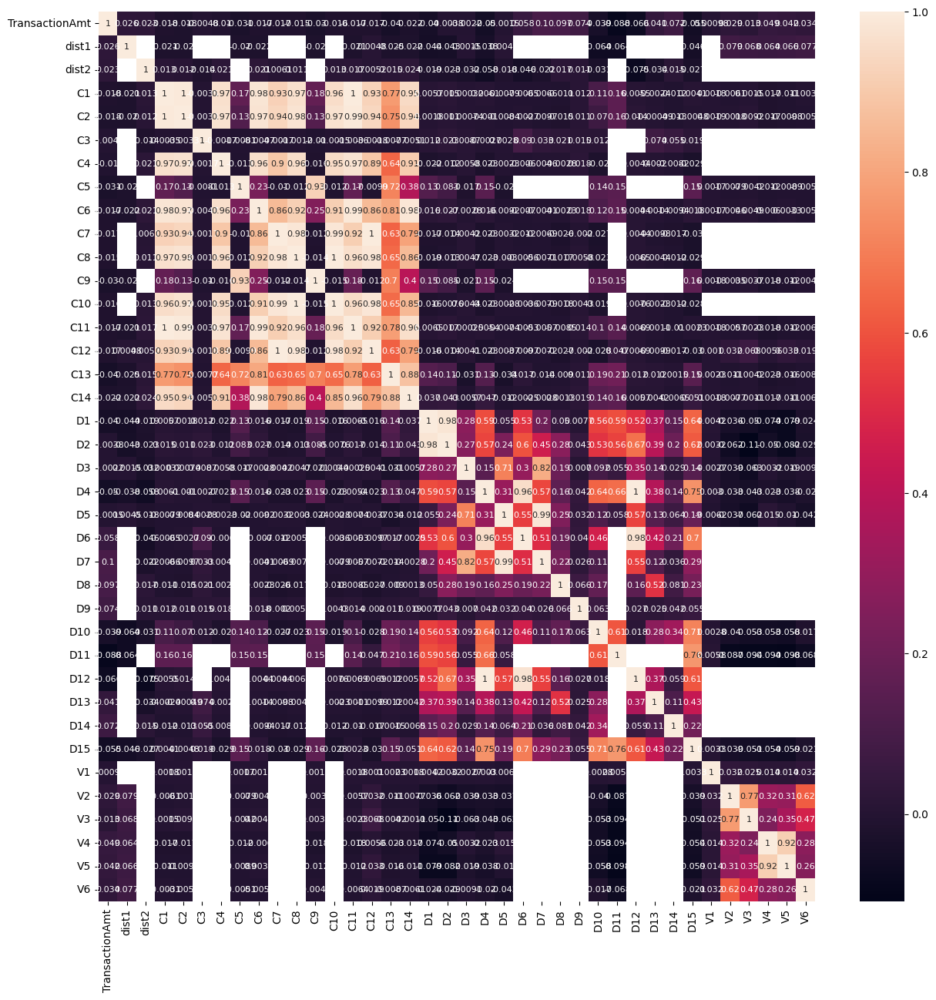

In [ ]:
#Subset the numeric features
corr_data = train_df[["TransactionAmt", "dist1", "dist2",
                      "C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14",
                      "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12", "D13", "D14", "D15",
                      "V1", "V2", "V3", "V4", "V5", "V6"]]
#Calculate correlation values
corr = corr_data.corr()
#Plot the correlation matrix
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

In [ ]:
#Display correlation values of numeric features
#In this cell correlation values of C1-C14 is displayed
corr_data = train_df[["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14"]]

# Calculate correlation values of C1-C14
corr = corr_data.corr()
# Print correlation values of C1-C14
print(corr)

           C1        C2        C3        C4        C5        C6        C7  \
C1   1.000000  0.995089 -0.003467  0.967800  0.165862  0.982238  0.926258   
C2   0.995089  1.000000 -0.003339  0.972134  0.126540  0.974845  0.938867   
C3  -0.003467 -0.003339  1.000000 -0.001720 -0.008101 -0.004711 -0.001730   
C4   0.967800  0.972134 -0.001720  1.000000 -0.012842  0.962319  0.895092   
C5   0.165862  0.126540 -0.008101 -0.012842  1.000000  0.232409 -0.009970   
C6   0.982238  0.974845 -0.004711  0.962319  0.232409  1.000000  0.858583   
C7   0.926258  0.938867 -0.001730  0.895092 -0.009970  0.858583  1.000000   
C8   0.967746  0.975863 -0.001203  0.959995 -0.011654  0.921972  0.982983   
C9   0.175999  0.133566 -0.010074 -0.015970  0.925786  0.250695 -0.012399   
C10  0.958202  0.970624 -0.001494  0.952466 -0.011846  0.914440  0.985062   
C11  0.996515  0.993898 -0.003583  0.974547  0.168862  0.991105  0.915209   
C12  0.927939  0.940258 -0.001763  0.894619 -0.009875  0.858182  0.999489   

In [ ]:
#In this cell correlation values of D1-D15 is displayed
corr_data = train_df[["D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12","D13", "D14", "D15"]]

# Calculate correlation values of D1-D15
corr = corr_data.corr()
# Print correlation values of D1-D15
print(corr)

           D1        D2        D3        D4        D5        D6        D7  \
D1   1.000000  0.981311  0.280423  0.585714  0.055236  0.525691  0.204924   
D2   0.981311  1.000000  0.266112  0.570017  0.238365  0.601299  0.454152   
D3   0.280423  0.266112  1.000000  0.149038  0.707425  0.304947  0.818080   
D4   0.585714  0.570017  0.149038  1.000000  0.313650  0.956966  0.574098   
D5   0.055236  0.238365  0.707425  0.313650  1.000000  0.551310  0.986496   
D6   0.525691  0.601299  0.304947  0.956966  0.551310  1.000000  0.506527   
D7   0.204924  0.454152  0.818080  0.574098  0.986496  0.506527  1.000000   
D8   0.050165  0.275304  0.194211  0.162900  0.249365  0.185532  0.223624   
D9   0.007667  0.042867  0.006983  0.041768  0.031991  0.040119  0.025509   
D10  0.562145  0.525967  0.092362  0.636928  0.116784  0.463143  0.107557   
D11  0.592629  0.563220  0.055433  0.657797  0.058496       NaN       NaN   
D12  0.521104  0.668833  0.349025  0.999999  0.565222  0.976834  0.553886   

In [ ]:
#In this cell correlation values of V1-V6 is displayed
corr_data = train_df[["V1", "V2", "V3", "V4", "V5", "V6"]]

# Calculate correlation values of v1-V6
corr = corr_data.corr()
# Print correlation values of v1-v6
print(corr)

          V1        V2        V3        V4        V5        V6
V1  1.000000  0.032168  0.024830  0.014216  0.013619  0.032284
V2  0.032168  1.000000  0.773039  0.318554  0.305504  0.621459
V3  0.024830  0.773039  1.000000  0.243684  0.353767  0.472570
V4  0.014216  0.318554  0.243684  1.000000  0.915164  0.279596
V5  0.013619  0.305504  0.353767  0.915164  1.000000  0.261490
V6  0.032284  0.621459  0.472570  0.279596  0.261490  1.000000


# Fill Missing Values

Missing values are filled in this section using different techniques.

In [ ]:
#Copy the dataframe into another dataframe
updated_train_df = train_df.copy()

Fill missing values of D1-D15 and dist1-dist2 features using a replacement. Missing values are replaced with a value of '-999'.

In [ ]:
#Subset the features to be filled with '-999'
numerical_features_to_fill = ['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'dist1', 'dist2']

# Fill missing values with -999 for the specified features
updated_train_df[numerical_features_to_fill] = train_df[numerical_features_to_fill].fillna(-999)

Fill missing values of the categorical variables by creating a new category of 'Unknown'. Missing values of the categorical features are filled with a value of 'Unknown'.

In [ ]:
#Subset the features to be filled
unknown_features_to_fill = ['card2', 'card3', 'card4', 'card5', 'card6', 'M1', 'M2', 'addr1', 'addr2']

# Fill missing values with 'Unknown' and create a new category in each feature
updated_train_df[unknown_features_to_fill] = train_df[unknown_features_to_fill].fillna('Unknown')

Fill missing values of V1-V6 with the mdeian value of the features. This is called median imputation.

In [ ]:
updated_train_df['V1'] = train_df['V1'].fillna(train_df['V1'].median())
updated_train_df['V2'] = train_df['V2'].fillna(train_df['V2'].median())
updated_train_df['V3'] = train_df['V3'].fillna(train_df['V3'].median())
updated_train_df['V4'] = train_df['V4'].fillna(train_df['V4'].median())
updated_train_df['V5'] = train_df['V5'].fillna(train_df['V5'].median())
updated_train_df['V6'] = train_df['V6'].fillna(train_df['V6'].median())

Draw the correlation matrix after filling all the missing values

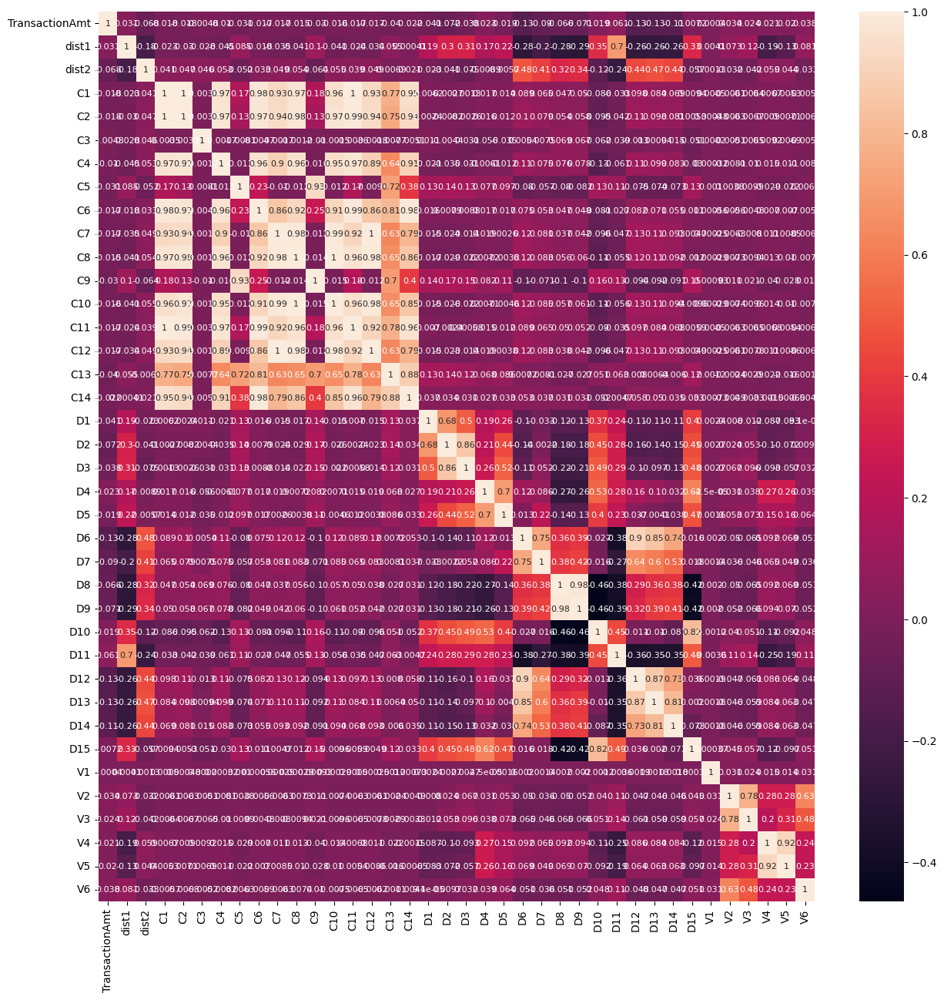

In [ ]:
corr_data = train_df[["TransactionAmt", "dist1", "dist2",
                      "C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14",
                      "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12", "D13", "D14", "D15",
                      "V1", "V2", "V3", "V4", "V5", "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

# Fruther plots

First a grouped histogram of fraudulent and non-fraudulent transactions are drawn against transaction amount.

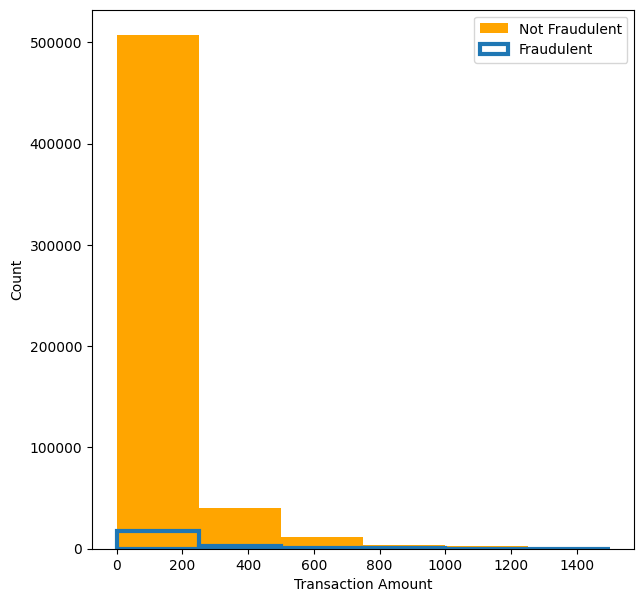

In [ ]:

bins_amount = [0,250,500,750,1000,1250,1500]
plt.figure(figsize=(7,7))

plt.hist(updated_train_df.loc[train_transaction['isFraud']== 0].TransactionAmt,bins=bins_amount,color='orange',
         label='Not Fraudulent')
plt.hist(updated_train_df.loc[train_transaction['isFraud']== 1].TransactionAmt,bins=bins_amount,facecolor='none',
         edgecolor='tab:blue',linewidth=3,label='Fraudulent')
plt.xlabel('Transaction Amount', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.legend()
plt.show();

Next, a scatter plot of transactions are drawn. Dist1 and dist2 is drawn against transaction amount

<Figure size 800x600 with 0 Axes>

Text(0.5, 1.0, 'dist1 vs dist2')

Text(0.5, 0, 'TransactionAmt')

Text(0, 0.5, 'dist1 / dist2')

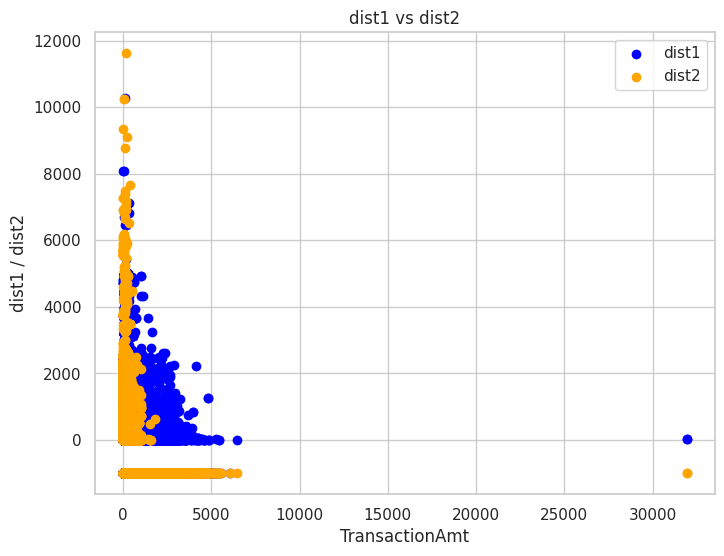

In [ ]:
# Scatter plot: dist1 in blue, dist2 in orange
plt.figure(figsize=(8, 6))
plt.scatter(updated_train_df['TransactionAmt'], updated_train_df['dist1'], color='blue', label='dist1')
plt.scatter(updated_train_df['TransactionAmt'], updated_train_df['dist2'], color='orange', label='dist2')
plt.title('dist1 vs dist2')
plt.xlabel('TransactionAmt')
plt.ylabel('dist1 / dist2')
plt.legend()
plt.show()


C1-C14 features are plotted against transaction amount

<Figure size 1800x1200 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'C1 vs TransactionAmt')

Text(0.5, 0, 'C1')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C2 vs TransactionAmt')

Text(0.5, 0, 'C2')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C3 vs TransactionAmt')

Text(0.5, 0, 'C3')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C4 vs TransactionAmt')

Text(0.5, 0, 'C4')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C5 vs TransactionAmt')

Text(0.5, 0, 'C5')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C6 vs TransactionAmt')

Text(0.5, 0, 'C6')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C7 vs TransactionAmt')

Text(0.5, 0, 'C7')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C8 vs TransactionAmt')

Text(0.5, 0, 'C8')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C9 vs TransactionAmt')

Text(0.5, 0, 'C9')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C10 vs TransactionAmt')

Text(0.5, 0, 'C10')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C11 vs TransactionAmt')

Text(0.5, 0, 'C11')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C12 vs TransactionAmt')

Text(0.5, 0, 'C12')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C13 vs TransactionAmt')

Text(0.5, 0, 'C13')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'C14 vs TransactionAmt')

Text(0.5, 0, 'C14')

Text(0, 0.5, 'TransactionAmt')

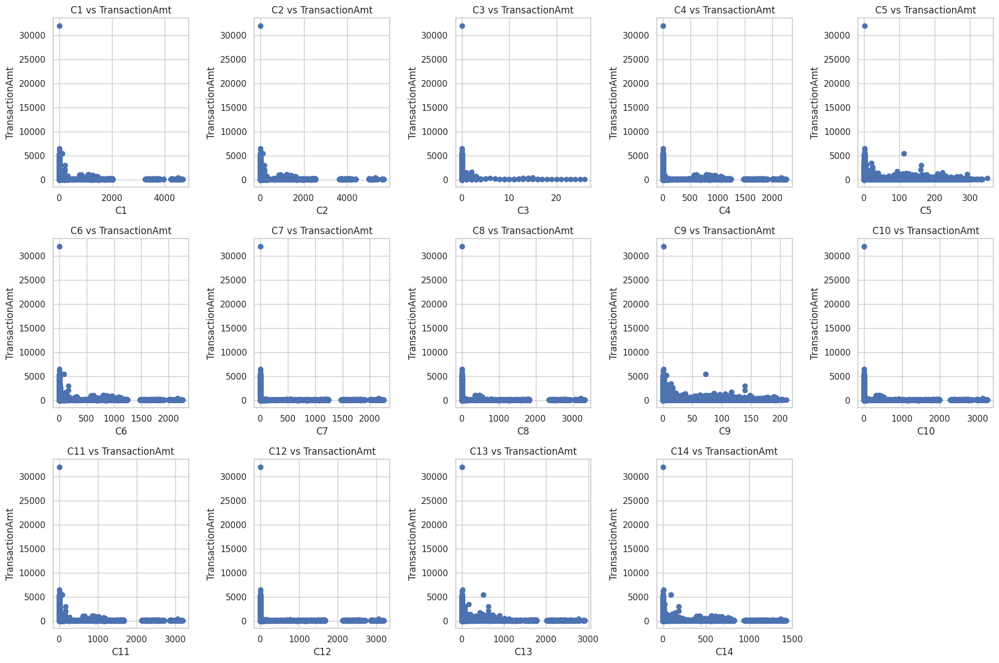

In [ ]:
# Example scatter plots for C1 to C14 against TransactionAmt
plt.figure(figsize=(18, 12))

# Loop through C1 to C14
for i in range(1, 15):
    plt.subplot(3, 5, i)
    plt.scatter(updated_train_df[f'C{i}'], updated_train_df['TransactionAmt'])
    plt.title(f'C{i} vs TransactionAmt')
    plt.xlabel(f'C{i}')
    plt.ylabel('TransactionAmt')

plt.tight_layout()
plt.show()


D1-D15 is also plotted against transaction amount

<Figure size 1800x1200 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'D1 vs TransactionAmt')

Text(0.5, 0, 'D1')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D2 vs TransactionAmt')

Text(0.5, 0, 'D2')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D3 vs TransactionAmt')

Text(0.5, 0, 'D3')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D4 vs TransactionAmt')

Text(0.5, 0, 'D4')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D5 vs TransactionAmt')

Text(0.5, 0, 'D5')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D6 vs TransactionAmt')

Text(0.5, 0, 'D6')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D7 vs TransactionAmt')

Text(0.5, 0, 'D7')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D8 vs TransactionAmt')

Text(0.5, 0, 'D8')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D9 vs TransactionAmt')

Text(0.5, 0, 'D9')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D10 vs TransactionAmt')

Text(0.5, 0, 'D10')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D11 vs TransactionAmt')

Text(0.5, 0, 'D11')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D12 vs TransactionAmt')

Text(0.5, 0, 'D12')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D13 vs TransactionAmt')

Text(0.5, 0, 'D13')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D14 vs TransactionAmt')

Text(0.5, 0, 'D14')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'D15 vs TransactionAmt')

Text(0.5, 0, 'D15')

Text(0, 0.5, 'TransactionAmt')

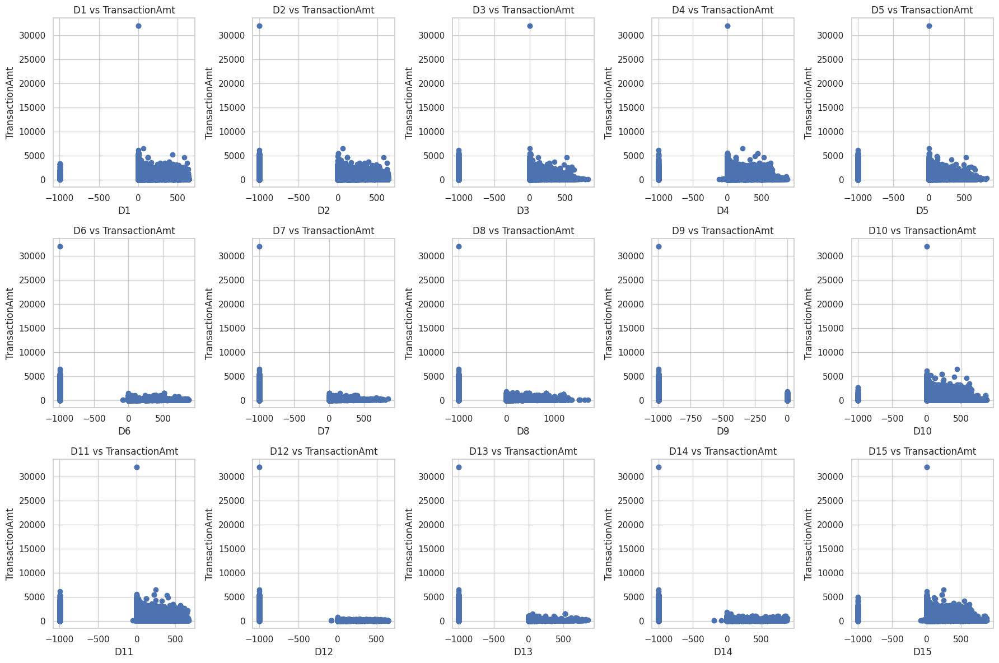

In [ ]:
# Example scatter plots for C1 to C14 against TransactionAmt
plt.figure(figsize=(18, 12))

# Loop through C1 to C14
for i in range(1, 16):
    plt.subplot(3, 5, i)
    plt.scatter(updated_train_df[f'D{i}'], updated_train_df['TransactionAmt'])
    plt.title(f'D{i} vs TransactionAmt')
    plt.xlabel(f'D{i}')
    plt.ylabel('TransactionAmt')

plt.tight_layout()
plt.show()


V1-V6 are plotted against transaction amount too

<Figure size 1800x1200 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'V1 vs TransactionAmt')

Text(0.5, 0, 'V1')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'V2 vs TransactionAmt')

Text(0.5, 0, 'V2')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'V3 vs TransactionAmt')

Text(0.5, 0, 'V3')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'V4 vs TransactionAmt')

Text(0.5, 0, 'V4')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'V5 vs TransactionAmt')

Text(0.5, 0, 'V5')

Text(0, 0.5, 'TransactionAmt')

<Axes: >

Text(0.5, 1.0, 'V6 vs TransactionAmt')

Text(0.5, 0, 'V6')

Text(0, 0.5, 'TransactionAmt')

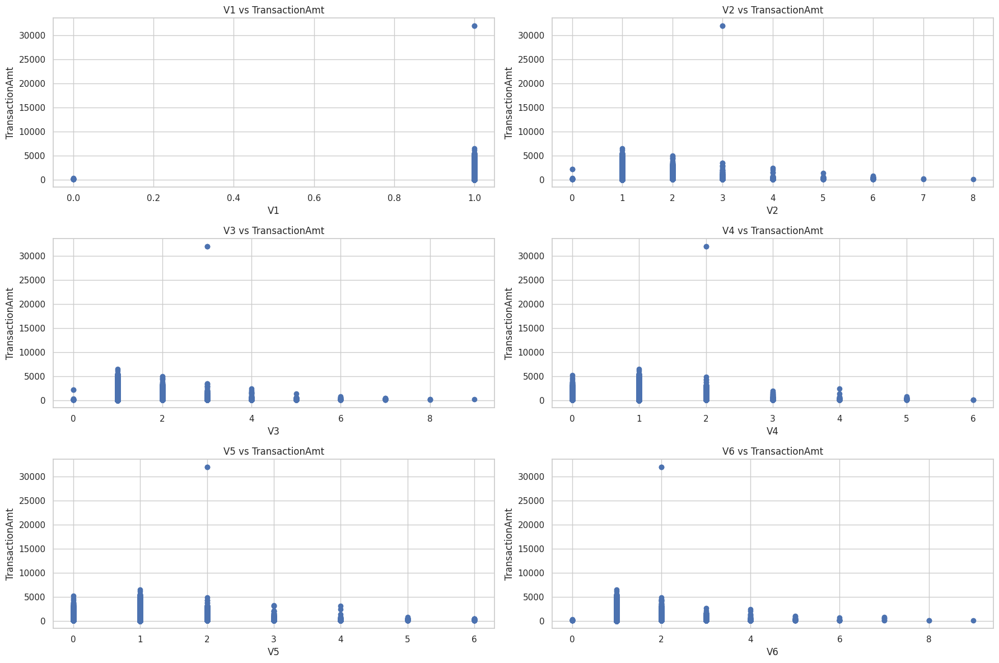

In [ ]:
# Example scatter plots for C1 to C14 against TransactionAmt
plt.figure(figsize=(18, 12))

# Loop through C1 to C14
for i in range(1, 7):
    plt.subplot(3, 2, i)
    plt.scatter(updated_train_df[f'V{i}'], updated_train_df['TransactionAmt'])
    plt.title(f'V{i} vs TransactionAmt')
    plt.xlabel(f'V{i}')
    plt.ylabel('TransactionAmt')

plt.tight_layout()
plt.show()


Skewness of D1-D15 features are plotted in the next cell.

<Figure size 1500x2000 with 0 Axes>

<Axes: >

<Axes: xlabel='D1', ylabel='Count'>

Text(0.5, 1.0, 'D1\nSkewness: 0.98')

<Axes: >

<Axes: xlabel='D2', ylabel='Count'>

Text(0.5, 1.0, 'D2\nSkewness: 0.05')

<Axes: >

<Axes: xlabel='D3', ylabel='Count'>

Text(0.5, 1.0, 'D3\nSkewness: -0.19')

<Axes: >

<Axes: xlabel='D4', ylabel='Count'>

Text(0.5, 1.0, 'D4\nSkewness: -0.62')

<Axes: >

<Axes: xlabel='D5', ylabel='Count'>

Text(0.5, 1.0, 'D5\nSkewness: 0.15')

<Axes: >

<Axes: xlabel='D6', ylabel='Count'>

Text(0.5, 1.0, 'D6\nSkewness: 2.39')

<Axes: >

<Axes: xlabel='D7', ylabel='Count'>

Text(0.5, 1.0, 'D7\nSkewness: 3.57')

<Axes: >

<Axes: xlabel='D8', ylabel='Count'>

Text(0.5, 1.0, 'D8\nSkewness: 2.50')

<Axes: >

<Axes: xlabel='D9', ylabel='Count'>

Text(0.5, 1.0, 'D9\nSkewness: 2.24')

<Axes: >

<Axes: xlabel='D10', ylabel='Count'>

Text(0.5, 1.0, 'D10\nSkewness: -1.39')

<Axes: >

<Axes: xlabel='D11', ylabel='Count'>

Text(0.5, 1.0, 'D11\nSkewness: 0.06')

<Axes: >

KeyboardInterrupt: ignored

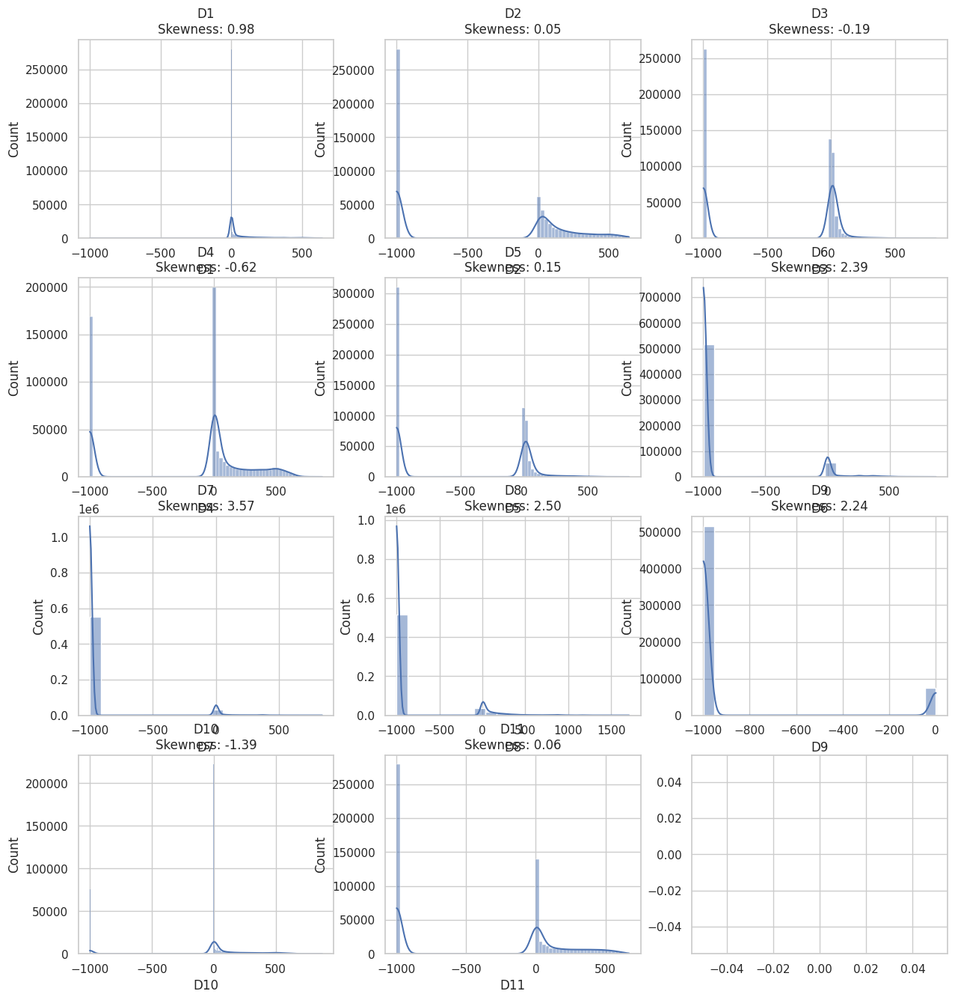

In [ ]:
import seaborn as sns
from scipy.stats import skew

# Define the numeric features
numeric_features = ["D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11",
                    "D12", "D13", "D14", "D15"]

# Plot distributions with skewness
plt.figure(figsize=(15, 20))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 3, i)
    sns.histplot(updated_train_df[feature], kde=True)
    plt.title(f'{feature}\nSkewness: {skew(updated_train_df[feature]):.2f}')

plt.tight_layout()
plt.show()


Skewness of v1-V6 are plotted as follows.

<Figure size 1000x1500 with 0 Axes>

<Axes: >

<Axes: xlabel='V1', ylabel='Count'>

Text(0.5, 1.0, 'V1\nSkewness: -186.37')

<Axes: >

<Axes: xlabel='V2', ylabel='Count'>

Text(0.5, 1.0, 'V2\nSkewness: 9.44')

<Axes: >

<Axes: xlabel='V3', ylabel='Count'>

Text(0.5, 1.0, 'V3\nSkewness: 7.56')

<Axes: >

<Axes: xlabel='V4', ylabel='Count'>

Text(0.5, 1.0, 'V4\nSkewness: -1.17')

<Axes: >

<Axes: xlabel='V5', ylabel='Count'>

Text(0.5, 1.0, 'V5\nSkewness: -0.18')

<Axes: >

<Axes: xlabel='V6', ylabel='Count'>

Text(0.5, 1.0, 'V6\nSkewness: 9.37')

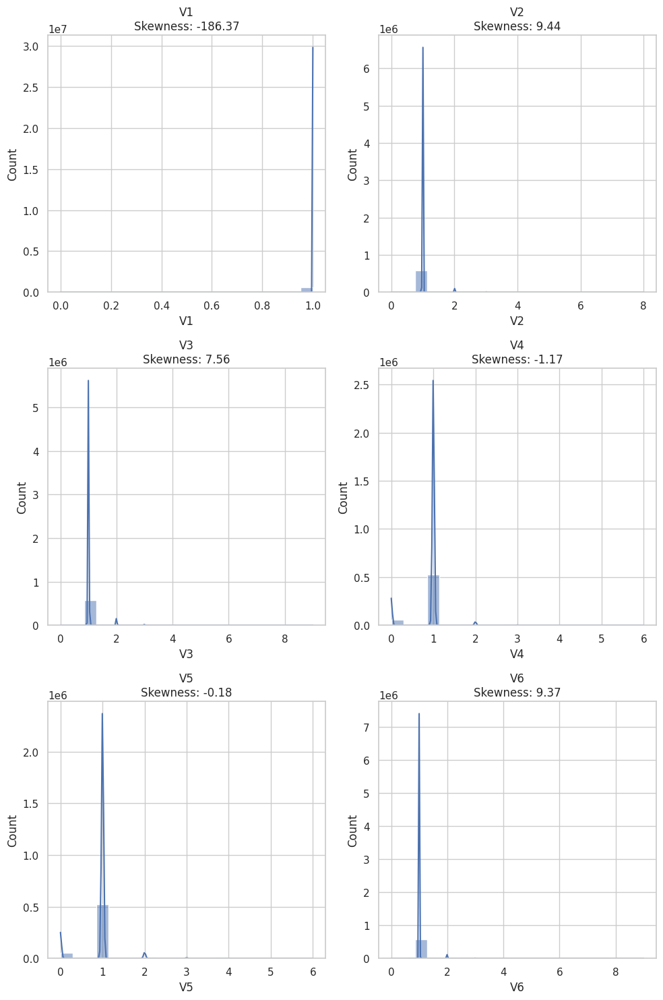

In [ ]:
import seaborn as sns
from scipy.stats import skew

# Define the numeric features
numeric_features = ["V1", "V2", "V3", "V4", "V5", "V6"]

# Plot distributions with skewness
plt.figure(figsize=(10, 15))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(3, 2, i)
    sns.histplot(updated_train_df[feature], kde=True)
    plt.title(f'{feature}\nSkewness: {skew(updated_train_df[feature]):.2f}')

plt.tight_layout()
plt.show()


Skewness of dist1 and dist2 are plotted in below cell.

<Figure size 1000x1500 with 0 Axes>

<Axes: >

<Axes: xlabel='TransactionAmt', ylabel='Count'>

Text(0.5, 1.0, 'TransactionAmt\nSkewness: 14.37')

<Axes: >

<Axes: xlabel='dist1', ylabel='Count'>

Text(0.5, 1.0, 'dist1\nSkewness: 1.33')

<Axes: >

<Axes: xlabel='dist2', ylabel='Count'>

Text(0.5, 1.0, 'dist2\nSkewness: 6.04')

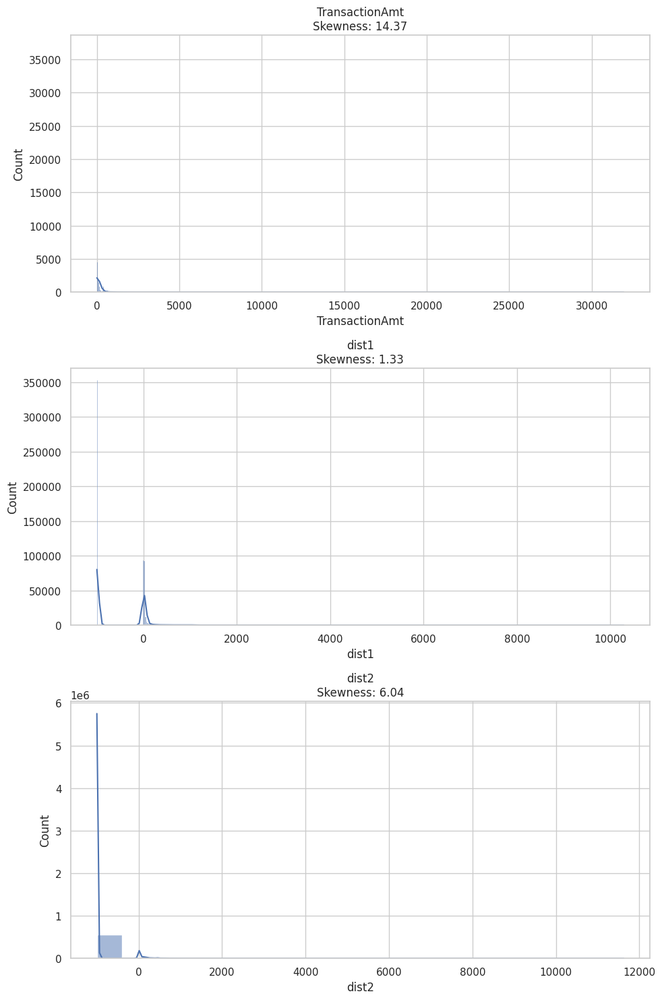

In [ ]:
import seaborn as sns
from scipy.stats import skew

# Define the numeric features
numeric_features = ["TransactionAmt", "dist1", "dist2"]

# Plot distributions with skewness
plt.figure(figsize=(10, 15))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(3, 1, i)
    sns.histplot(updated_train_df[feature], kde=True)
    plt.title(f'{feature}\nSkewness: {skew(updated_train_df[feature]):.2f}')

plt.tight_layout()
plt.show()


# Analysing Categorical Variables

In this section, categorical variables are analysed.

Values of categorical variable are observed to get and understanding of the values each categorical variable contain.

In [ ]:
# List of categorical variables
categorical_vars = ["card2", "card3", "card4", "card5", "card6", "addr1", "addr2", "M1", "M2"]

# Display unique values and counts for each variable
for var in categorical_vars:
    unique_values = updated_train_df[var].unique()
    value_counts = updated_train_df[var].value_counts()
    print(f"\n{var}:\n{unique_values}\n\nCounts:\n{value_counts}\n{'='*40}")



card2:
['Unknown' 404.0 490.0 567.0 514.0 555.0 360.0 100.0 111.0 352.0 375.0
 418.0 303.0 314.0 543.0 583.0 148.0 321.0 269.0 361.0 272.0 399.0 569.0
 453.0 417.0 512.0 545.0 266.0 114.0 481.0 452.0 547.0 383.0 170.0 343.0
 556.0 285.0 562.0 302.0 264.0 558.0 500.0 396.0 103.0 206.0 143.0 243.0
 476.0 199.0 174.0 423.0 446.0 492.0 523.0 440.0 528.0 161.0 535.0 354.0
 117.0 455.0 325.0 158.0 268.0 122.0 479.0 147.0 215.0 480.0 265.0 388.0
 408.0 309.0 415.0 414.0 437.0 104.0 225.0 101.0 134.0 586.0 191.0 491.0
 369.0 322.0 494.0 532.0 313.0 474.0 324.0 475.0 298.0 429.0 432.0 553.0
 566.0 599.0 296.0 251.0 310.0 242.0 204.0 250.0 270.0 346.0 316.0 194.0
 587.0 390.0 135.0 536.0 254.0 226.0 327.0 420.0 260.0 413.0 428.0 561.0
 387.0 411.0 392.0 203.0 297.0 136.0 276.0 142.0 527.0 210.0 184.0 459.0
 118.0 585.0 106.0 588.0 449.0 176.0 177.0 246.0 439.0 503.0 445.0 172.0
 468.0 239.0 496.0 364.0 533.0 370.0 578.0 150.0 458.0 365.0 359.0 509.0
 202.0 584.0 258.0 442.0 530.0 489.0 529.0 50

## Plots

Then, the categorical variables are visualized in plots.
First the distributions of the unique values and their counts are visualized in count plots for each variable.

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card2', ylabel='count'>

Text(0.5, 1.0, 'Distribution of card2')

Text(0.5, 0, 'card2')

Text(0, 0.5, 'Count')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Other'),
  Text(1, 0, '321.0'),
  Text(2, 0, '111.0'),
  Text(3, 0, '555.0'),
  Text(4, 0, '490.0'),
  Text(5, 0, '583.0'),
  Text(6, 0, '170.0'),
  Text(7, 0, '194.0'),
  Text(8, 0, '545.0'),
  Text(9, 0, '360.0'),
  Text(10, 0, '514.0')])

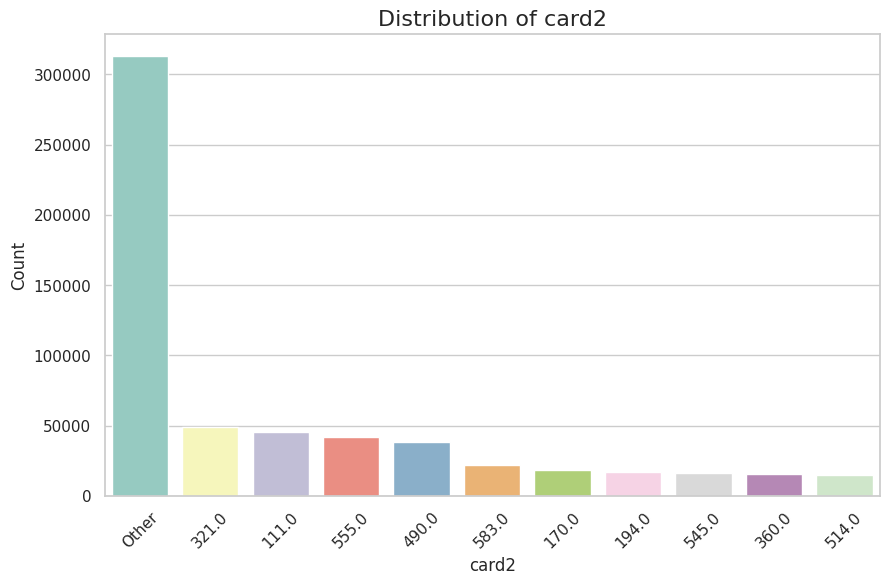

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card3', ylabel='count'>

Text(0.5, 1.0, 'Distribution of card3')

Text(0.5, 0, 'card3')

Text(0, 0.5, 'Count')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '150.0'),
  Text(1, 0, '185.0'),
  Text(2, 0, 'Other'),
  Text(3, 0, '106.0'),
  Text(4, 0, 'Unknown'),
  Text(5, 0, '144.0'),
  Text(6, 0, '146.0'),
  Text(7, 0, '117.0'),
  Text(8, 0, '143.0'),
  Text(9, 0, '119.0'),
  Text(10, 0, '102.0')])

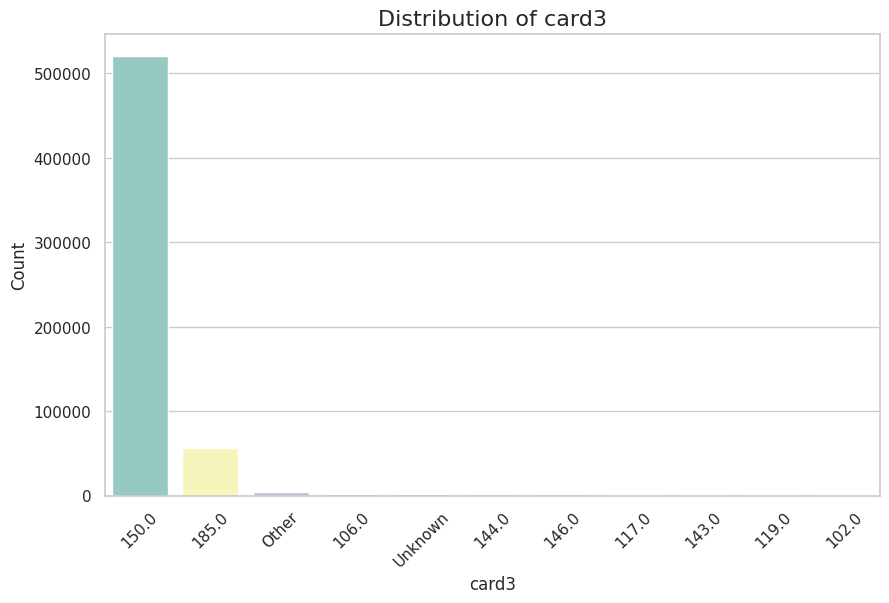

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card4', ylabel='count'>

Text(0.5, 1.0, 'Distribution of card4')

Text(0.5, 0, 'card4')

Text(0, 0.5, 'Count')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'visa'),
  Text(1, 0, 'mastercard'),
  Text(2, 0, 'american express'),
  Text(3, 0, 'discover'),
  Text(4, 0, 'Unknown')])

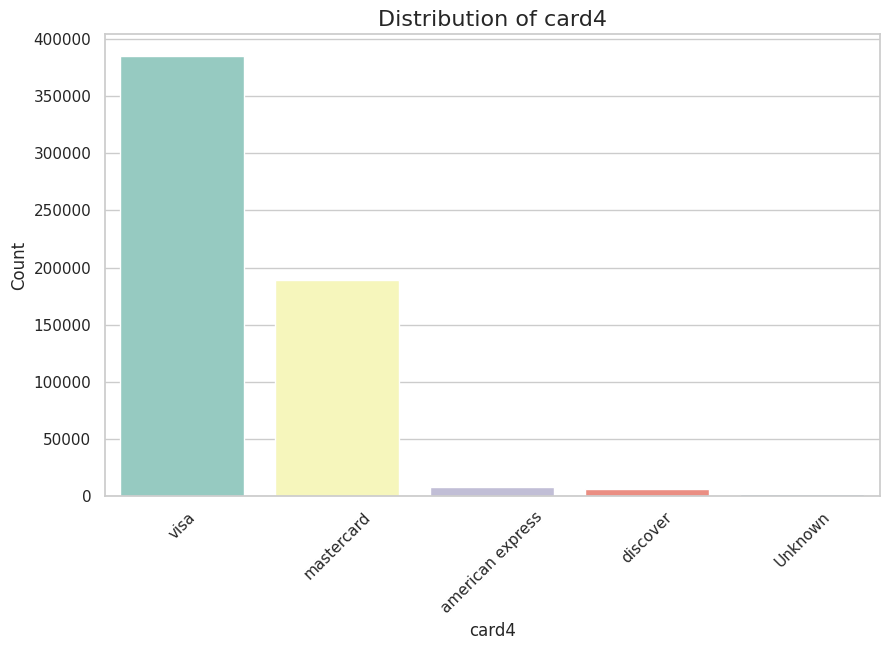

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card5', ylabel='count'>

Text(0.5, 1.0, 'Distribution of card5')

Text(0.5, 0, 'card5')

Text(0, 0.5, 'Count')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '226.0'),
  Text(1, 0, '224.0'),
  Text(2, 0, '166.0'),
  Text(3, 0, 'Other'),
  Text(4, 0, '102.0'),
  Text(5, 0, '117.0'),
  Text(6, 0, '138.0'),
  Text(7, 0, '195.0'),
  Text(8, 0, '137.0'),
  Text(9, 0, '126.0'),
  Text(10, 0, '219.0')])

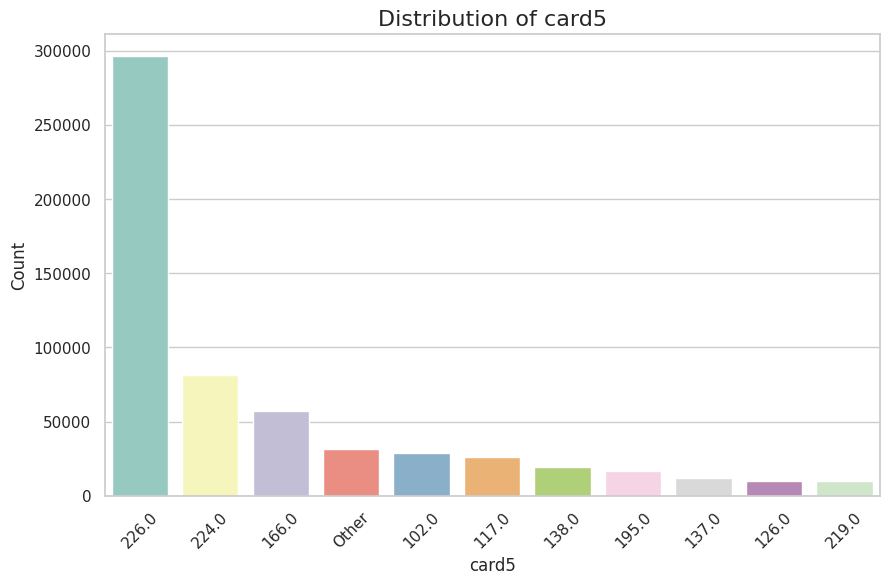

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card6', ylabel='count'>

Text(0.5, 1.0, 'Distribution of card6')

Text(0.5, 0, 'card6')

Text(0, 0.5, 'Count')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'debit'),
  Text(1, 0, 'credit'),
  Text(2, 0, 'Unknown'),
  Text(3, 0, 'debit or credit'),
  Text(4, 0, 'charge card')])

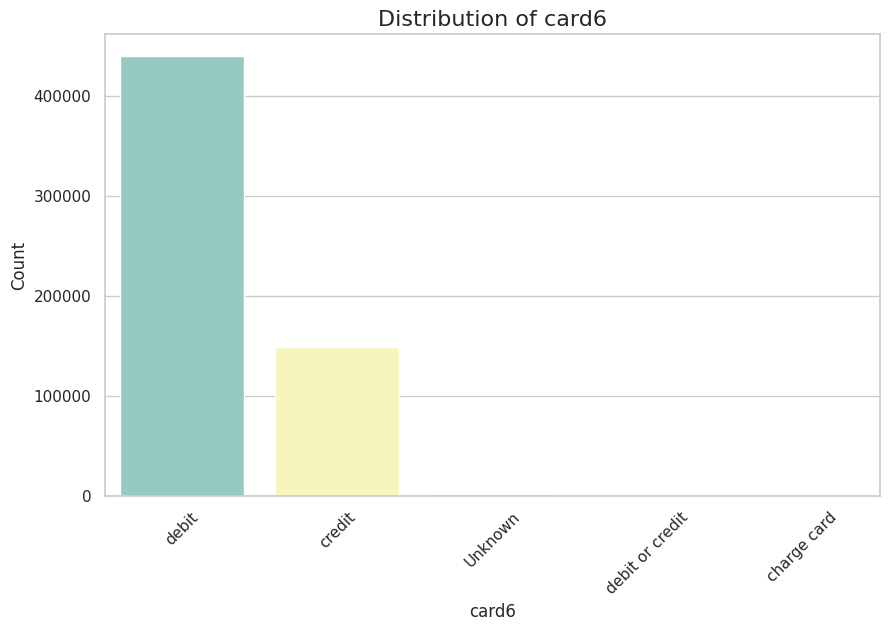

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='addr1', ylabel='count'>

Text(0.5, 1.0, 'Distribution of addr1')

Text(0.5, 0, 'addr1')

Text(0, 0.5, 'Count')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Other'),
  Text(1, 0, 'Unknown'),
  Text(2, 0, '299.0'),
  Text(3, 0, '325.0'),
  Text(4, 0, '204.0'),
  Text(5, 0, '264.0'),
  Text(6, 0, '330.0'),
  Text(7, 0, '315.0'),
  Text(8, 0, '441.0'),
  Text(9, 0, '272.0'),
  Text(10, 0, '123.0')])

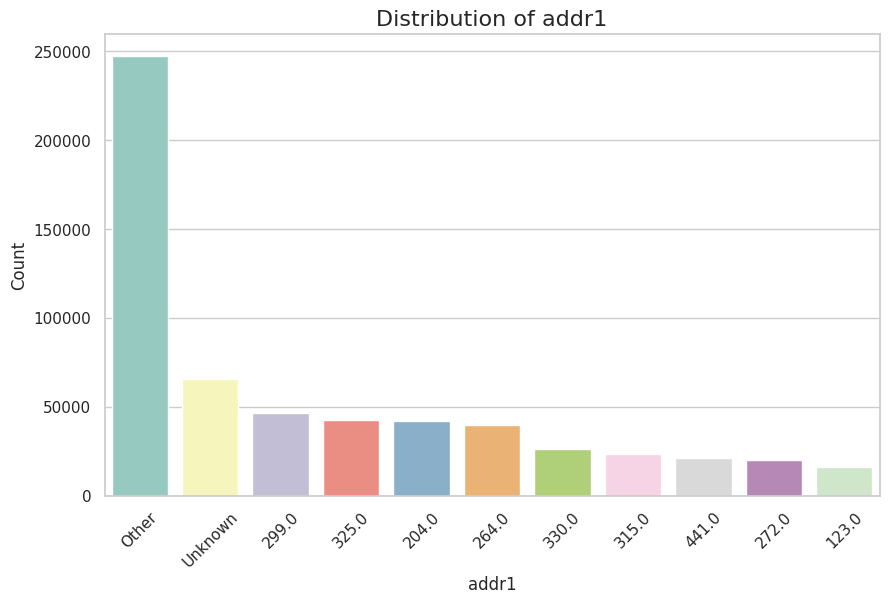

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='addr2', ylabel='count'>

Text(0.5, 1.0, 'Distribution of addr2')

Text(0.5, 0, 'addr2')

Text(0, 0.5, 'Count')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '87.0'),
  Text(1, 0, 'Unknown'),
  Text(2, 0, '60.0'),
  Text(3, 0, '96.0'),
  Text(4, 0, 'Other'),
  Text(5, 0, '32.0'),
  Text(6, 0, '65.0'),
  Text(7, 0, '16.0'),
  Text(8, 0, '31.0'),
  Text(9, 0, '19.0'),
  Text(10, 0, '26.0')])

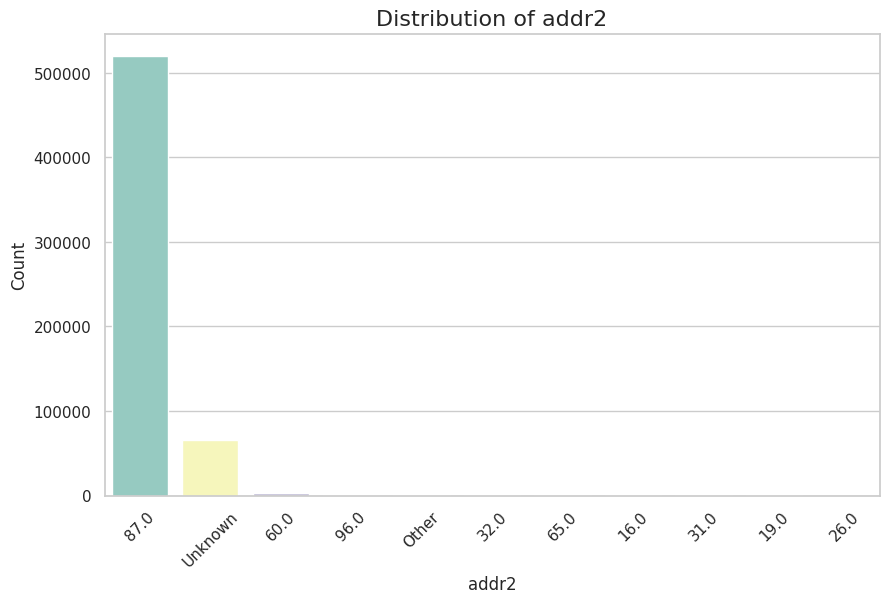

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='M1', ylabel='count'>

Text(0.5, 1.0, 'Distribution of M1')

Text(0.5, 0, 'M1')

Text(0, 0.5, 'Count')

(array([0, 1, 2]), [Text(0, 0, 'T'), Text(1, 0, 'Unknown'), Text(2, 0, 'F')])

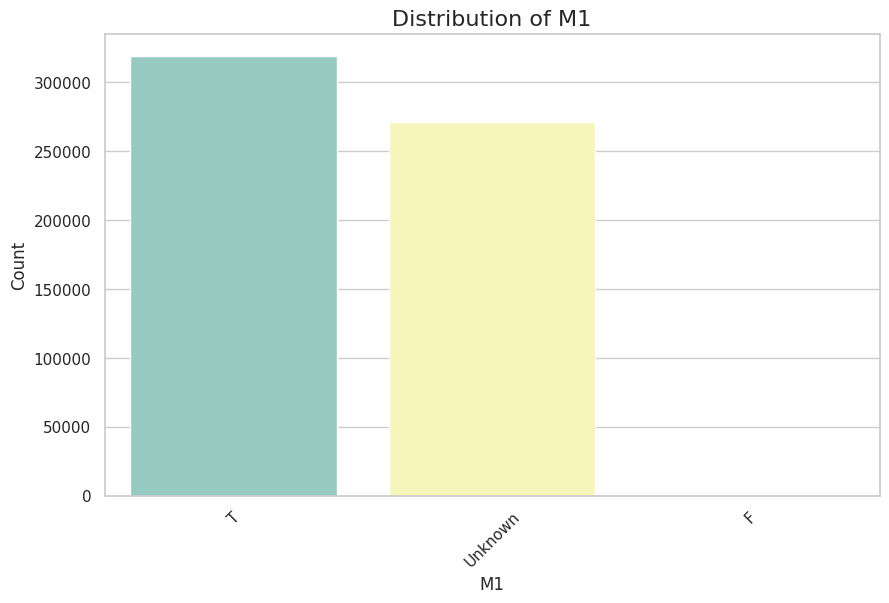

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='M2', ylabel='count'>

Text(0.5, 1.0, 'Distribution of M2')

Text(0.5, 0, 'M2')

Text(0, 0.5, 'Count')

(array([0, 1, 2]), [Text(0, 0, 'T'), Text(1, 0, 'Unknown'), Text(2, 0, 'F')])

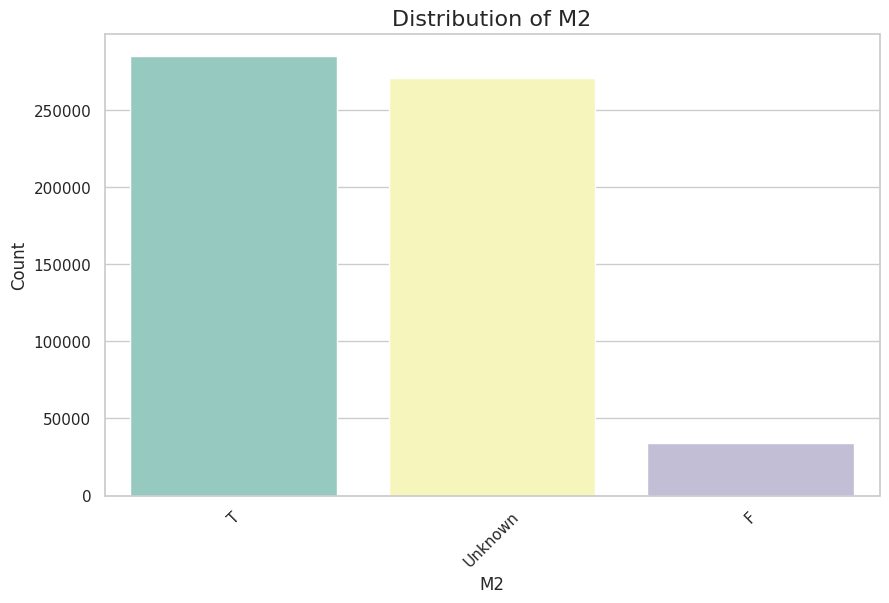

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for Seaborn plots
sns.set(style="whitegrid")

# Define the number of top categories to display as some  feature have many categories and plotting them all in one plot will not make any clear interpretations.
top_n = 10

# Visualize distributions for each variable
for var in categorical_vars:
    plt.figure(figsize=(10, 6))

    # Select the top 10 categories
    top_categories = updated_train_df[var].value_counts().nlargest(top_n).index

    # Group the rest into an "Other" category
    updated_train_df[var] = updated_train_df[var].apply(lambda x: x if x in top_categories else 'Other')

    sns.countplot(x=var, data=updated_train_df, palette="Set3", order=updated_train_df[var].value_counts().index)
    plt.title(f'Distribution of {var}', fontsize=16)
    plt.xlabel(var, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45)
    plt.show()


Categorical variables are plotted in bar plots against the mean of the transaction values for each category of each feature.

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card4'>

Text(0.5, 1.0, 'Mean TransactionAmt by card4')

Text(0.5, 0, 'Card4 Category')

Text(0, 0.5, 'Mean TransactionAmt')

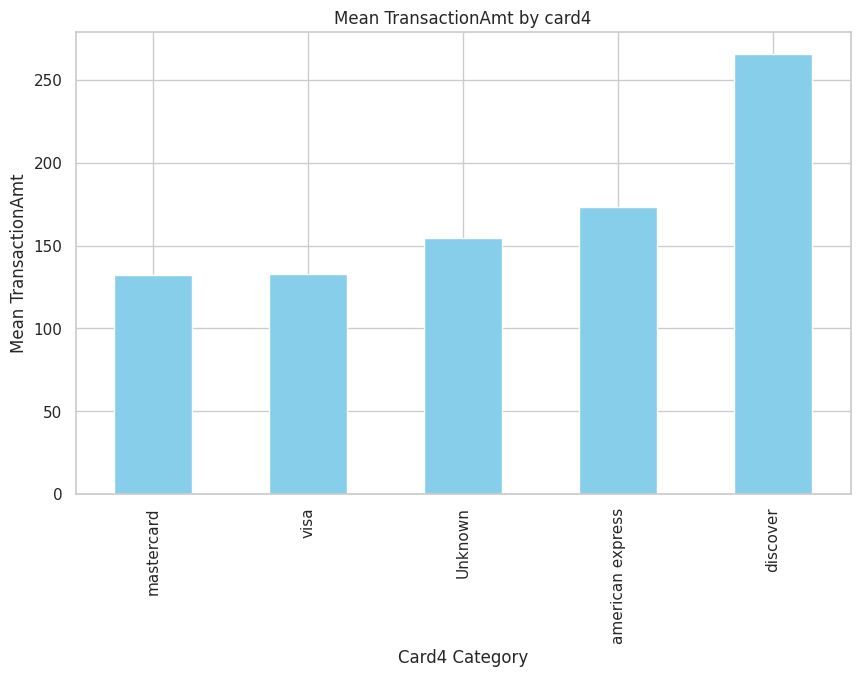

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card6'>

Text(0.5, 1.0, 'Mean TransactionAmt by card6')

Text(0.5, 0, 'Card6 Category')

Text(0, 0.5, 'Mean TransactionAmt')

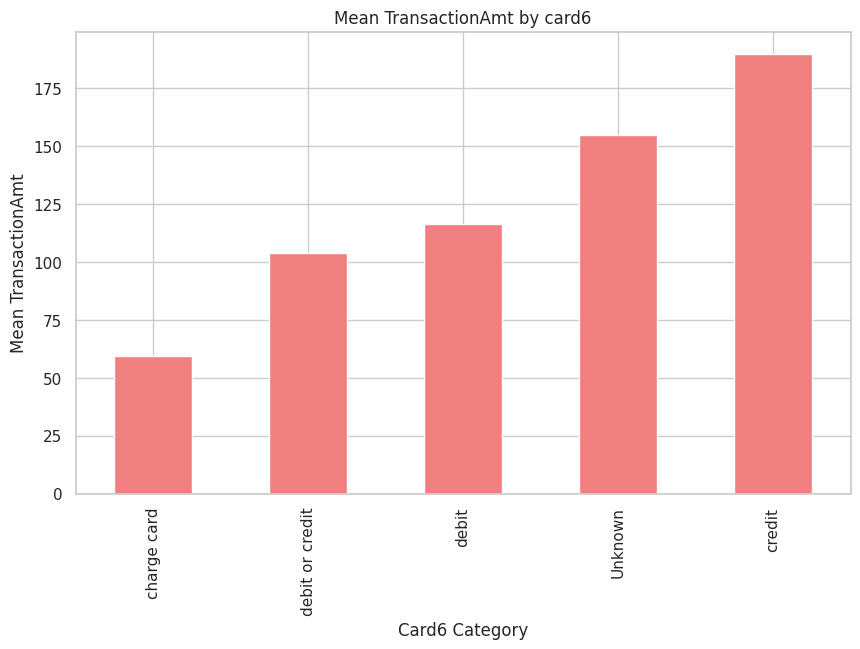

<Figure size 1400x600 with 0 Axes>

<Axes: xlabel='addr2'>

Text(0.5, 1.0, 'Mean TransactionAmt by addr2')

Text(0.5, 0, 'Addr2 Category')

Text(0, 0.5, 'Mean TransactionAmt')

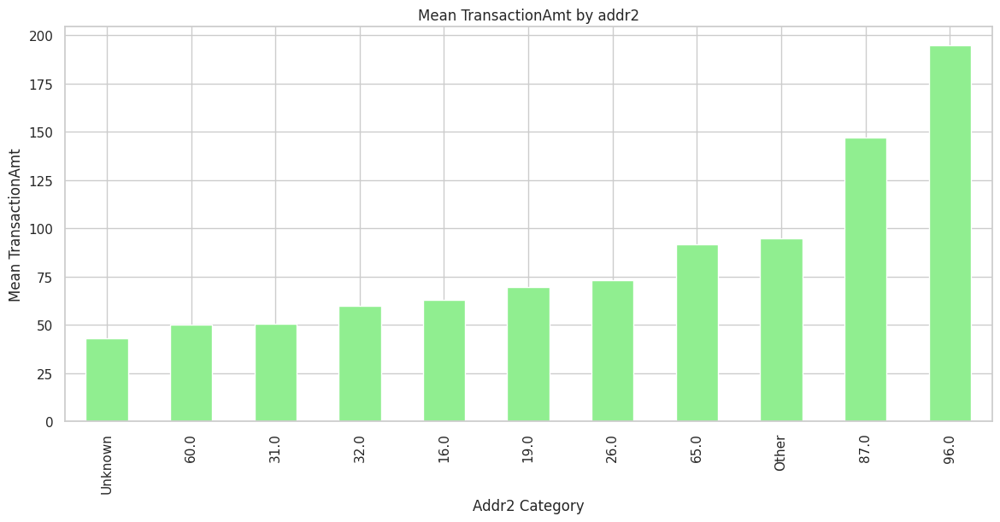

<Figure size 1400x600 with 0 Axes>

<Axes: xlabel='addr1'>

Text(0.5, 1.0, 'Mean TransactionAmt by addr1')

Text(0.5, 0, 'Addr1 Category')

Text(0, 0.5, 'Mean TransactionAmt')

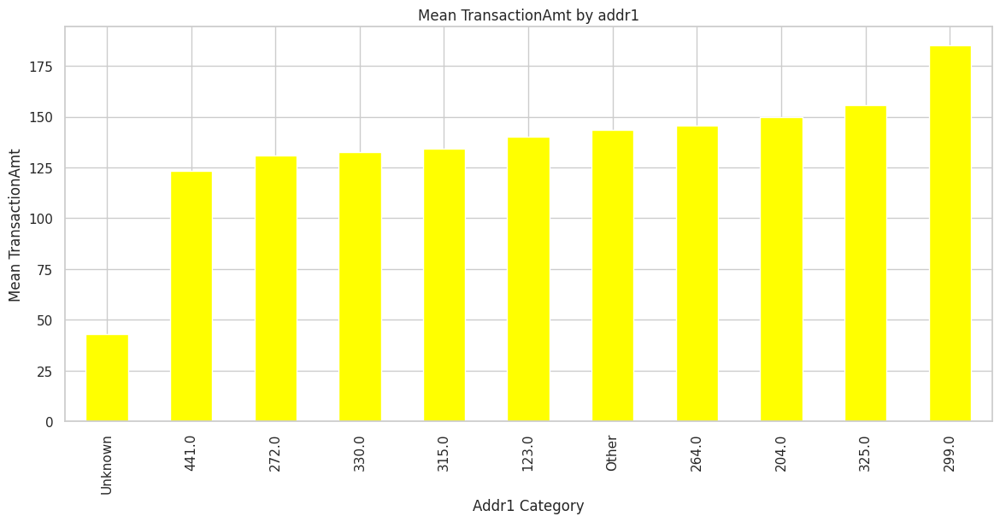

<Figure size 1400x600 with 0 Axes>

<Axes: xlabel='M1'>

Text(0.5, 1.0, 'Mean TransactionAmt by M1')

Text(0.5, 0, 'M1 Category')

Text(0, 0.5, 'Mean TransactionAmt')

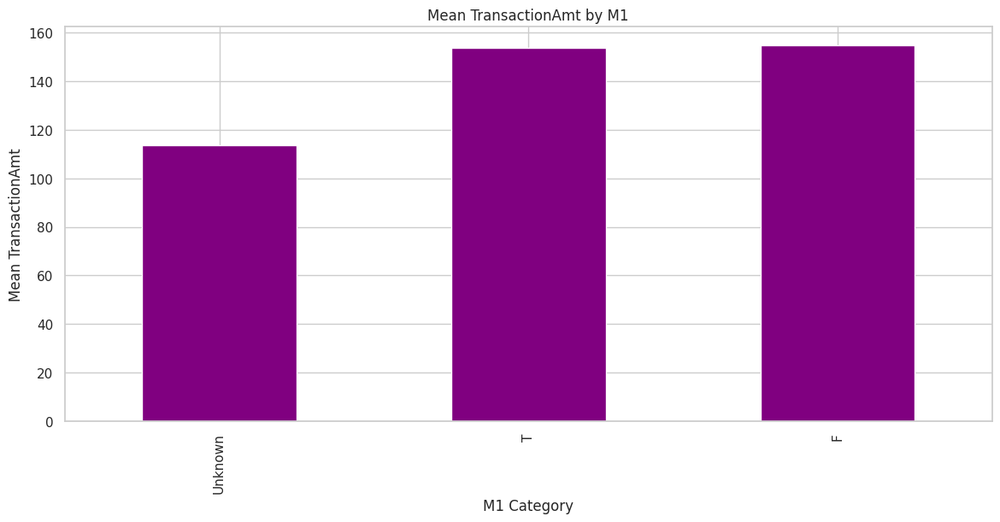

<Figure size 1400x600 with 0 Axes>

<Axes: xlabel='addr1'>

Text(0.5, 1.0, 'Mean TransactionAmt by M2')

Text(0.5, 0, 'M2 Category')

Text(0, 0.5, 'Mean TransactionAmt')

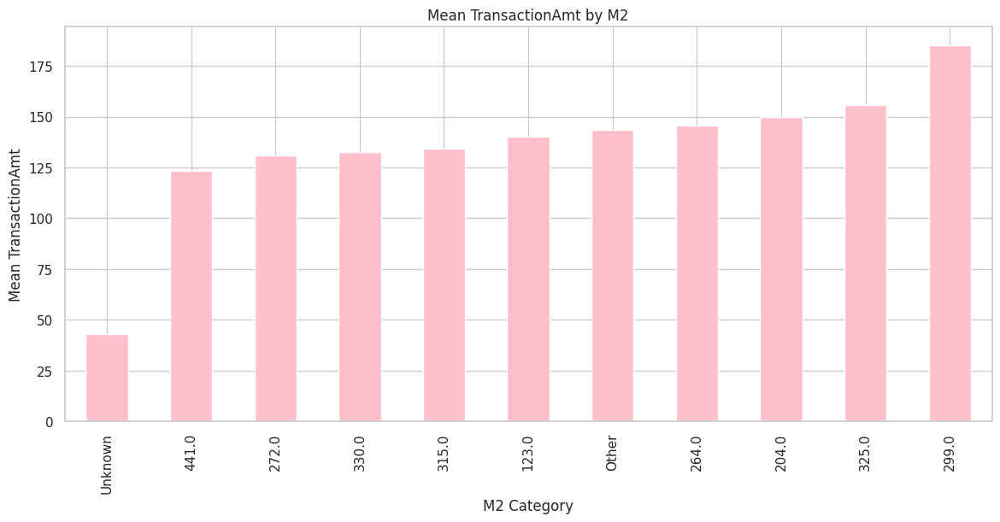

In [ ]:
# Aggregate data based on card4, calculate mean or sum of TransactionAmt
agg_card4 = updated_train_df.groupby('card4')['TransactionAmt'].mean()  # You can use 'sum' instead of 'mean' if you want the sum
agg_card4 = agg_card4.sort_values()  # Sort the values for better visualization

# Plot bar chart for card4
plt.figure(figsize=(10, 6))
agg_card4.plot(kind='bar', color='skyblue')
plt.title('Mean TransactionAmt by card4')
plt.xlabel('Card4 Category')
plt.ylabel('Mean TransactionAmt')
plt.show()

# Repeat the process for card6 and addr2
agg_card6 = updated_train_df.groupby('card6')['TransactionAmt'].mean()
agg_card6 = agg_card6.sort_values()

plt.figure(figsize=(10, 6))
agg_card6.plot(kind='bar', color='lightcoral')
plt.title('Mean TransactionAmt by card6')
plt.xlabel('Card6 Category')
plt.ylabel('Mean TransactionAmt')
plt.show()

agg_addr2 = updated_train_df.groupby('addr2')['TransactionAmt'].mean()
agg_addr2 = agg_addr2.sort_values()

plt.figure(figsize=(14, 6))
agg_addr2.plot(kind='bar', color='lightgreen')
plt.title('Mean TransactionAmt by addr2')
plt.xlabel('Addr2 Category')
plt.ylabel('Mean TransactionAmt')
plt.show()


agg_addr1 = updated_train_df.groupby('addr1')['TransactionAmt'].mean()
agg_addr1 = agg_addr1.sort_values()

plt.figure(figsize=(14, 6))
agg_addr1.plot(kind='bar', color='yellow')
plt.title('Mean TransactionAmt by addr1')
plt.xlabel('Addr1 Category')
plt.ylabel('Mean TransactionAmt')
plt.show()

agg_M1 = updated_train_df.groupby('M1')['TransactionAmt'].mean()
agg_M1 = agg_M1.sort_values()

plt.figure(figsize=(14, 6))
agg_M1.plot(kind='bar', color='purple')
plt.title('Mean TransactionAmt by M1')
plt.xlabel('M1 Category')
plt.ylabel('Mean TransactionAmt')
plt.show()

agg_M2 = updated_train_df.groupby('M2')['TransactionAmt'].mean()
agg_M2 = agg_addr1.sort_values()

plt.figure(figsize=(14, 6))
agg_M2.plot(kind='bar', color='pink')
plt.title('Mean TransactionAmt by M2')
plt.xlabel('M2 Category')
plt.ylabel('Mean TransactionAmt')
plt.show()

Categorical variables are plotted in bar plots against the mean of the transaction values for each category of each feature grouped by the target variable.

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card4'>

Text(0.5, 1.0, 'Mean TransactionAmt by card4 and isFraud')

Text(0.5, 0, 'Card4 Category')

Text(0, 0.5, 'Mean TransactionAmt')

<Figure size 1000x600 with 0 Axes>

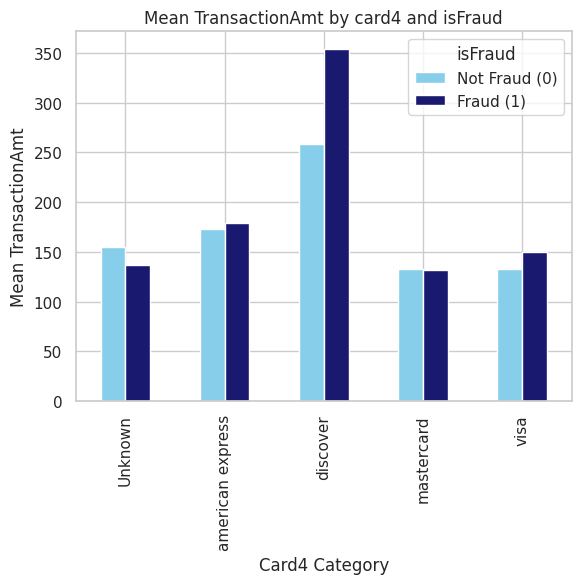

In [ ]:
import matplotlib.pyplot as plt

# Group by card4 and isFraud
agg_card4_fraud = updated_train_df.groupby(['card4', 'isFraud'])['TransactionAmt'].mean().unstack()

# Plot bar chart for card4 and isFraud
plt.figure(figsize=(10, 6))
agg_card4_fraud.plot(kind='bar', color=['skyblue', 'midnightblue'])
plt.title('Mean TransactionAmt by card4 and isFraud')
plt.xlabel('Card4 Category')
plt.ylabel('Mean TransactionAmt')
plt.legend(title='isFraud', labels=['Not Fraud (0)', 'Fraud (1)'])
plt.show()


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='card6'>

Text(0.5, 1.0, 'Mean TransactionAmt by card6 and isFraud')

Text(0.5, 0, 'Card6 Category')

Text(0, 0.5, 'Mean TransactionAmt')

<Figure size 1000x600 with 0 Axes>

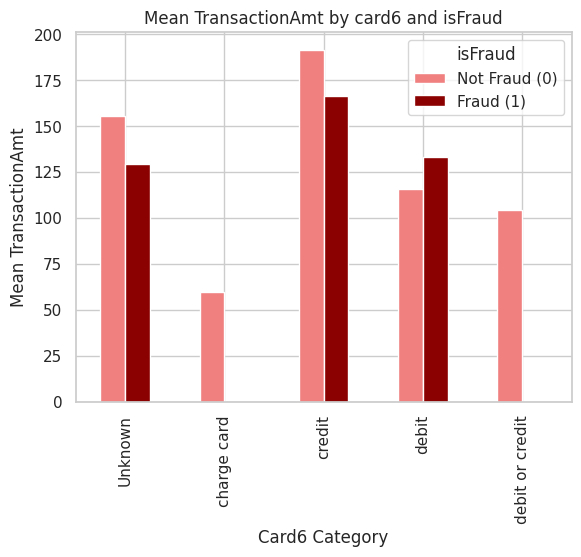

In [ ]:
# Group by card6 and isFraud
agg_card6_fraud = updated_train_df.groupby(['card6', 'isFraud'])['TransactionAmt'].mean().unstack()

# Plot bar chart for card6 and isFraud
plt.figure(figsize=(10, 6))
agg_card6_fraud.plot(kind='bar', color=['lightcoral', 'darkred'])
plt.title('Mean TransactionAmt by card6 and isFraud')
plt.xlabel('Card6 Category')
plt.ylabel('Mean TransactionAmt')
plt.legend(title='isFraud', labels=['Not Fraud (0)', 'Fraud (1)'])
plt.show()

# Repeat the process for addr2, addr1, M1, and M2...


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='addr1'>

Text(0.5, 1.0, 'Mean TransactionAmt by Addr1 and isFraud')

Text(0.5, 0, 'Addr1 Category')

Text(0, 0.5, 'Mean TransactionAmt')

<Figure size 1000x600 with 0 Axes>

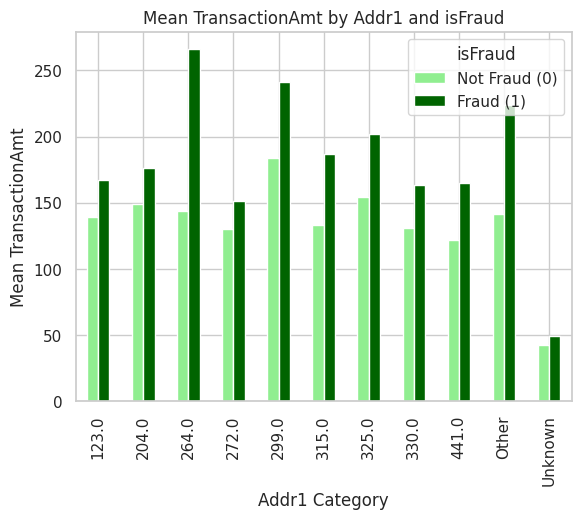

In [ ]:
# Group by card6 and isFraud
agg_addr1_fraud = updated_train_df.groupby(['addr1', 'isFraud'])['TransactionAmt'].mean().unstack()

# Plot bar chart for card6 and isFraud
plt.figure(figsize=(10, 6))
agg_addr1_fraud.plot(kind='bar', color=['lightgreen', 'darkgreen'])
plt.title('Mean TransactionAmt by Addr1 and isFraud')
plt.xlabel('Addr1 Category')
plt.ylabel('Mean TransactionAmt')
plt.legend(title='isFraud', labels=['Not Fraud (0)', 'Fraud (1)'])
plt.show()

# Repeat the process for addr2, addr1, M1, and M2...


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='addr2'>

Text(0.5, 1.0, 'Mean TransactionAmt by Addr2 and isFraud')

Text(0.5, 0, 'Addr2 Category')

Text(0, 0.5, 'Mean TransactionAmt')

<Figure size 1000x600 with 0 Axes>

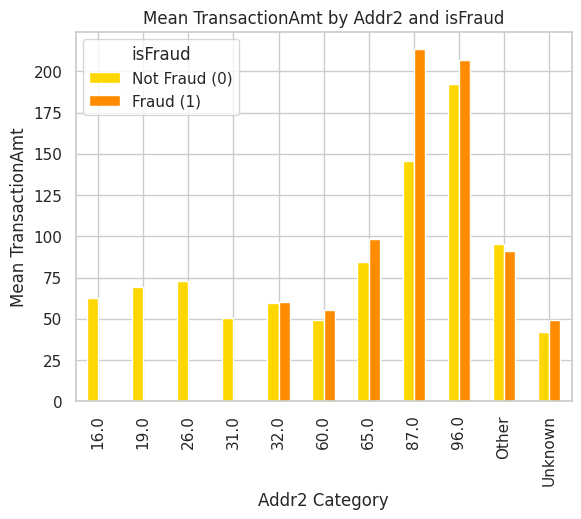

In [ ]:
# Group by card6 and isFraud
agg_addr2_fraud = updated_train_df.groupby(['addr2', 'isFraud'])['TransactionAmt'].mean().unstack()

# Plot bar chart for card6 and isFraud
plt.figure(figsize=(10, 6))
agg_addr2_fraud.plot(kind='bar', color=['gold', 'darkorange'])
plt.title('Mean TransactionAmt by Addr2 and isFraud')
plt.xlabel('Addr2 Category')
plt.ylabel('Mean TransactionAmt')
plt.legend(title='isFraud', labels=['Not Fraud (0)', 'Fraud (1)'])
plt.show()

# Repeat the process for addr2, addr1, M1, and M2...


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='M1'>

Text(0.5, 1.0, 'Mean TransactionAmt by M1 and isFraud')

Text(0.5, 0, 'M1 Category')

Text(0, 0.5, 'Mean TransactionAmt')

<Figure size 1000x600 with 0 Axes>

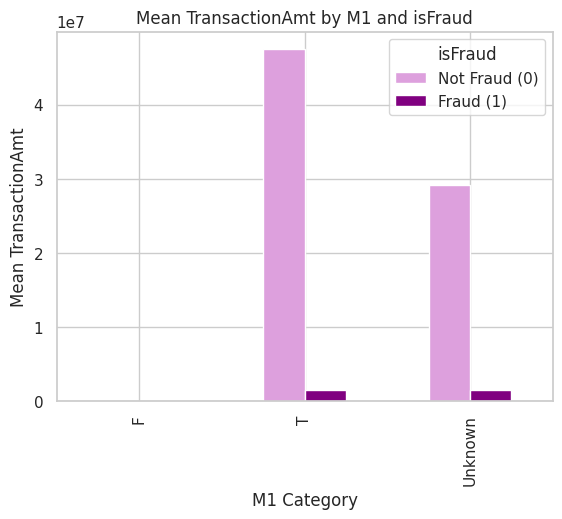

In [ ]:
# Group by card6 and isFraud
agg_M1_fraud = updated_train_df.groupby(['M1', 'isFraud'])['TransactionAmt'].sum().unstack()

# Plot bar chart for card6 and isFraud
plt.figure(figsize=(10, 6))
agg_M1_fraud.plot(kind='bar', color=['plum', 'purple'])
plt.title('Mean TransactionAmt by M1 and isFraud')
plt.xlabel('M1 Category')
plt.ylabel('Mean TransactionAmt')
plt.legend(title='isFraud', labels=['Not Fraud (0)', 'Fraud (1)'])
plt.show()

# Repeat the process for addr2, addr1, M1, and M2...


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='M2'>

Text(0.5, 1.0, 'Mean TransactionAmt by M2 and isFraud')

Text(0.5, 0, 'M2 Category')

Text(0, 0.5, 'Mean TransactionAmt')

<Figure size 1000x600 with 0 Axes>

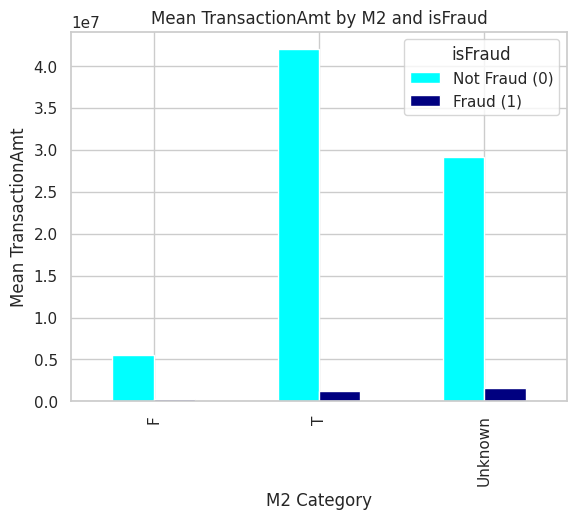

In [ ]:
# Group by card6 and isFraud
agg_M2_fraud = updated_train_df.groupby(['M2', 'isFraud'])['TransactionAmt'].sum().unstack()

# Plot bar chart for card6 and isFraud
plt.figure(figsize=(10, 6))
agg_M2_fraud.plot(kind='bar', color=['aqua', 'navy'])
plt.title('Mean TransactionAmt by M2 and isFraud')
plt.xlabel('M2 Category')
plt.ylabel('Mean TransactionAmt')
plt.legend(title='isFraud', labels=['Not Fraud (0)', 'Fraud (1)'])
plt.show()

# Repeat the process for addr2, addr1, M1, and M2...


## Chi-squared Test

Chi-squared test is performed on the categorical variables to observe the relationships among the categorical variables.

In [ ]:
from scipy.stats import chi2_contingency

# Define your categorical features
cat_features = ["card2", "card3", "card4", "card5", "card6", "addr1", "addr2", "M1", "M2"]

# Loop through pairs of categorical features
for i in range(len(cat_features)):
    for j in range(i+1, len(cat_features)):
        # Create a contingency table
        contingency_table = pd.crosstab(updated_train_df[cat_features[i]], updated_train_df[cat_features[j]])

        # Perform the chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Output the results
        print(f"Chi-squared test for independence between {cat_features[i]} and {cat_features[j]}:")
        print(f"Chi-squared value: {chi2}")
        print(f"P-value: {p}")
        print("")

Chi-squared test for independence between card2 and card3:
Chi-squared value: 237729.39748750793
P-value: 0.0

Chi-squared test for independence between card2 and card4:
Chi-squared value: 148782.079282762
P-value: 0.0

Chi-squared test for independence between card2 and card5:
Chi-squared value: 671234.2999795732
P-value: 0.0

Chi-squared test for independence between card2 and card6:
Chi-squared value: 155988.3241695394
P-value: 0.0

Chi-squared test for independence between card2 and addr1:
Chi-squared value: 198123.0542488579
P-value: 0.0

Chi-squared test for independence between card2 and addr2:
Chi-squared value: 154826.54862447118
P-value: 0.0

Chi-squared test for independence between card2 and M1:
Chi-squared value: 32815.065241649594
P-value: 0.0

Chi-squared test for independence between card2 and M2:
Chi-squared value: 33074.09216232387
P-value: 0.0

Chi-squared test for independence between card3 and card4:
Chi-squared value: 590879.3980645072
P-value: 0.0

Chi-squared te

In [ ]:
# Assuming 'updated_train_df' is your DataFrame and 'cat_features' is the list of categorical features
cat_features = ["card2", "card3", "card4", "card5", "card6", "addr1", "addr2", "M1", "M2"]

# Create a new DataFrame with only the selected categorical features
cat_df = updated_train_df[cat_features]

# Initialize an empty DataFrame to store the p-values
chi2_results = pd.DataFrame(index=cat_features, columns=cat_features)

# Loop through pairs of categorical variables
for feature1 in cat_features:
    for feature2 in cat_features:
        # Create a contingency table
        contingency_table = pd.crosstab(cat_df[feature1], cat_df[feature2])

        # Perform the chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Store the p-value in the results DataFrame
        chi2_results.loc[feature1, feature2] = p

# Display the results in table format
print("Chi-squared test p-values:")
print(chi2_results.to_markdown())


Chi-squared test p-values:
|       |   card2 |   card3 |   card4 |   card5 |   card6 |   addr1 |   addr2 |   M1 |   M2 |
|:------|--------:|--------:|--------:|--------:|--------:|--------:|--------:|-----:|-----:|
| card2 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| card3 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| card4 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| card5 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| card6 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| addr1 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| addr2 |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| M1    |       0 |       0 |       0 |       0 |       0 |       0 |       0 |    0 |    0 |
| M2    |       0 |       0 |    

## Encoding

As some categorical features are not encoded, they are encoded in this section to further proceed with modeling.

In [ ]:
updated_train_df_encoded = updated_train_df.copy()

In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Define your categorical features
cat_features = ["addr1", "addr2"]

# Convert numeric values to strings
updated_train_df_encoded[cat_features] = updated_train_df_encoded[cat_features].astype(str)

# Initialize a dictionary to store encoders for each feature
encoders = {}

# Loop through each categorical feature and perform encoding
for feature in cat_features:
    # Initialize LabelEncoder for the current feature
    label_encoder = LabelEncoder()

    # Fit and transform the labels to integers
    integer_encoded = label_encoder.fit_transform(updated_train_df_encoded[feature])

    # Store the encoder in the dictionary
    encoders[feature] = label_encoder

    # Replace the original column in the DataFrame with the encoded values
    updated_train_df_encoded[feature] = integer_encoded

# Apply OneHotEncoder on the entire DataFrame with the categorical features
onehot_encoder = OneHotEncoder(sparse=False)
onehot_encoded = onehot_encoder.fit_transform(updated_train_df_encoded[cat_features])

# Print the one-hot encoded values
print(onehot_encoded)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

cat_features = ["card2", "card3"]

updated_train_df_encoded[cat_features] = updated_train_df_encoded[cat_features].astype(str)

encoders = {}

for feature in cat_features:
    label_encoder = LabelEncoder()

    integer_encoded = label_encoder.fit_transform(updated_train_df_encoded[feature])

    encoders[feature] = label_encoder

    updated_train_df_encoded[feature] = integer_encoded

onehot_encoder = OneHotEncoder(sparse=False)
onehot_encoded = onehot_encoder.fit_transform(updated_train_df_encoded[cat_features])

print(onehot_encoded)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

cat_features = ["card4", "card5"]

updated_train_df_encoded[cat_features] = updated_train_df_encoded[cat_features].astype(str)

encoders = {}

for feature in cat_features:
    label_encoder = LabelEncoder()

    integer_encoded = label_encoder.fit_transform(updated_train_df_encoded[feature])

    encoders[feature] = label_encoder

    updated_train_df_encoded[feature] = integer_encoded

onehot_encoder = OneHotEncoder(sparse=False)
onehot_encoded = onehot_encoder.fit_transform(updated_train_df_encoded[cat_features])

print(onehot_encoded)


[[0. 0. 1. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

cat_features = ["card6", "M1"]

updated_train_df_encoded[cat_features] = updated_train_df_encoded[cat_features].astype(str)

encoders = {}

for feature in cat_features:
    label_encoder = LabelEncoder()

    integer_encoded = label_encoder.fit_transform(updated_train_df_encoded[feature])

    encoders[feature] = label_encoder

    updated_train_df_encoded[feature] = integer_encoded

onehot_encoder = OneHotEncoder(sparse=False)
onehot_encoded = onehot_encoder.fit_transform(updated_train_df_encoded[cat_features])

print(onehot_encoded)


[[0. 0. 1. ... 0. 1. 0.]
 [0. 0. 1. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 1. ... 0. 1. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

cat_features = ["M2"]

encoders = {}

for feature in cat_features:
    label_encoder = LabelEncoder()

    integer_encoded = label_encoder.fit_transform(updated_train_df_encoded[feature])

    encoders[feature] = label_encoder

    updated_train_df_encoded[feature] = integer_encoded

onehot_encoder = OneHotEncoder(sparse_output=False)
onehot_encoded = onehot_encoder.fit_transform(updated_train_df_encoded[cat_features])

print(onehot_encoded)


[[0. 1. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 ...
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]]


In [ ]:
#Count missing values
missing_values  = updated_train_df_encoded.isnull().sum()

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the missing values
print(missing_values)

pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


isFraud           0
TransactionAmt    0
card2             0
card3             0
card4             0
card5             0
card6             0
addr1             0
addr2             0
dist1             0
dist2             0
C1                0
C2                0
C3                0
C4                0
C5                0
C6                0
C7                0
C8                0
C9                0
C10               0
C11               0
C12               0
C13               0
C14               0
D1                0
D2                0
D3                0
D4                0
D5                0
D6                0
D7                0
D8                0
D9                0
D10               0
D11               0
D12               0
D13               0
D14               0
D15               0
M1                0
M2                0
V1                0
V2                0
V3                0
V4                0
V5                0
V6                0
dtype: int64


## Information Gain

Perform 'Information Gain' on categorical variables to assess how the categorical variable contribute in brining values for fraud detection.

In [ ]:
from sklearn.feature_selection import mutual_info_classif

# Select the relevant features and target variable
features = ["card2", "card3", "card4", "card5", "card6", "addr1", "addr2", "M1", "M2"]
target = "isFraud"

# Create a new DataFrame with selected features
selected_df = updated_train_df_encoded[features + [target]].copy()

# Compute information gain
info_gain_scores = mutual_info_classif(selected_df[features], selected_df[target], random_state=42)

# Create a DataFrame to display information gain scores
info_gain_results = pd.DataFrame({"Feature": features, "Information Gain": info_gain_scores})

# Sort the DataFrame by 'Information Gain' column in descending order
info_gain_results_sorted = info_gain_results.sort_values(by="Information Gain", ascending=False)

# Display the sorted results
print(info_gain_results_sorted)



  Feature  Information Gain
1   card3          0.115069
6   addr2          0.090983
4   card6          0.085994
0   card2          0.079663
7      M1          0.070364
2   card4          0.070164
8      M2          0.061766
5   addr1          0.059453
3   card5          0.058615


## Random Forest Feature Extraction

Apply 'Random Forest Feature Extraction' on the remaining features to understand what kind of importance each variable has in predicting the target variable.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from imblearn.over_sampling import RandomOverSampler
import pandas as pd

# Split data into X and y
X = updated_train_df_encoded.drop(['isFraud'], axis=1)
y = updated_train_df_encoded['isFraud']

# Create the random oversampler object
ros = RandomOverSampler(random_state=42)

# Apply random oversampling to balance the classes
X, y = ros.fit_resample(X, y)

# Train Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importance scores
importances = rf.feature_importances_

# Create a dataframe of feature importances
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': importances})

# Sort features by importance score in descending order
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the feature importances
print(feature_importances)


RandomForestRegressor(random_state=42)

           feature    importance
17              C8  1.140971e-01
0   TransactionAmt  1.079266e-01
23             C14  8.516854e-02
26              D3  5.041506e-02
14              C5  4.632087e-02
6            addr1  4.171595e-02
10              C1  3.866051e-02
1            card2  3.657391e-02
22             C13  3.282407e-02
20             C11  3.039022e-02
33             D10  3.011769e-02
4            card5  3.007987e-02
38             D15  2.975184e-02
8            dist1  2.864475e-02
24              D1  2.757031e-02
25              D2  2.540304e-02
27              D4  2.406885e-02
15              C6  1.943513e-02
11              C2  1.851415e-02
31              D8  1.838645e-02
5            card6  1.607808e-02
34             D11  1.594079e-02
18              C9  1.571441e-02
28              D5  1.517496e-02
3            card4  1.163422e-02
13              C4  1.122744e-02
32              D9  9.236690e-03
2            card3  8.961253e-03
9            dist2  8.638922e-03
21        

## Wrapper Forward Method with Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

features = ['TransactionAmt', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2',
             'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14',
             'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15',
             'M1', 'M2', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
target = "isFraud"

# Create a new DataFrame with selected features
selected_df = updated_train_df_encoded[features + [target]].copy()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(selected_df[features], selected_df[target], test_size=0.3, random_state=42)

# Initialize an empty set for selected features
selected_features = []

# Initialize a Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)

while len(selected_features) < len(features):
    # Features not yet selected
    remaining_features = list(set(features) - set(selected_features))

    # Model with all the selected features so far
    X_train_subset = X_train[selected_features]
    X_test_subset = X_test[selected_features]

    # Store accuracy scores for each remaining feature
    accuracy_scores = []

    for feature in remaining_features:
    # Fit the Random Forest model with the current feature added
      model.fit(X_train_subset.join(X_train[[feature]]), y_train)

      # Make predictions on the test set
      y_pred = model.predict(X_test_subset.join(X_test[[feature]]))

      # Calculate accuracy and store the score
      accuracy = accuracy_score(y_test, y_pred)
      accuracy_scores.append((feature, accuracy))


    # Select the feature with the highest accuracy
    best_feature, best_accuracy = max(accuracy_scores, key=lambda x: x[1])

    # Add the best feature to the selected features
    selected_features.append(best_feature)

    print(f"Selected Feature: {best_feature}, Accuracy: {best_accuracy}")




RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: C12, Accuracy: 0.9664600760885517


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: C1, Accuracy: 0.9687009629604543


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: C13, Accuracy: 0.9720086700308193


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: card2, Accuracy: 0.9741931113895756


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: D15, Accuracy: 0.9770040979442544


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: addr1, Accuracy: 0.9796796152673823


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: C6, Accuracy: 0.9806787008500695


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

Selected Feature: card5, Accuracy: 0.9813786252130818


RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

RandomForestClassifier(random_state=42)

KeyboardInterrupt: ignored

## Dropping or creating new features

Add 'card2', 'card3' and 'card5' to create a new feature, 'card_bank_feature'

In [ ]:
updated_train_df_encoded['card_bank_feature'] = updated_train_df_encoded['card2'] + updated_train_df_encoded['card3'] + updated_train_df_encoded['card5']

In [ ]:
updated_train_df_encoded['addr_concat'] = updated_train_df_encoded['addr1'] + updated_train_df_encoded['addr2']

In [ ]:
from scipy.stats import chi2_contingency
# Assuming 'updated_train_df' is your DataFrame and 'cat_features' is the list of categorical features
cat_features = ["card_bank_feature", "card4", "card6", "addr_concat", "M1", "M2"]

# Create a new DataFrame with only the selected categorical features
cat_df = updated_train_df_encoded[cat_features]

# Initialize an empty DataFrame to store the p-values
chi2_results = pd.DataFrame(index=cat_features, columns=cat_features)

# Loop through pairs of categorical variables
for feature1 in cat_features:
    for feature2 in cat_features:
        # Create a contingency table
        contingency_table = pd.crosstab(cat_df[feature1], cat_df[feature2])

        # Perform the chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Store the p-value in the results DataFrame
        chi2_results.loc[feature1, feature2] = p

# Display the results in table format
print("Chi-squared test p-values:")
print(chi2_results.to_markdown())


Chi-squared test p-values:
|                   |   card_bank_feature |   card4 |   card6 |   addr_concat |   M1 |   M2 |
|:------------------|--------------------:|--------:|--------:|--------------:|-----:|-----:|
| card_bank_feature |                   0 |       0 |       0 |             0 |    0 |    0 |
| card4             |                   0 |       0 |       0 |             0 |    0 |    0 |
| card6             |                   0 |       0 |       0 |             0 |    0 |    0 |
| addr_concat       |                   0 |       0 |       0 |             0 |    0 |    0 |
| M1                |                   0 |       0 |       0 |             0 |    0 |    0 |
| M2                |                   0 |       0 |       0 |             0 |    0 |    0 |


In [ ]:
from sklearn.feature_selection import mutual_info_classif

# Select the relevant features and target variable
features = ["card_bank_feature", "card4", "card6", "addr_concat", "M1", "M2"]
target = "isFraud"

# Create a new DataFrame with selected features
selected_df = updated_train_df_encoded[features + [target]].copy()

# Compute information gain
info_gain_scores = mutual_info_classif(selected_df[features], selected_df[target], random_state=42)

# Create a DataFrame to display information gain scores
info_gain_results = pd.DataFrame({"Feature": features, "Information Gain": info_gain_scores})

# Sort the DataFrame by 'Information Gain' column in descending order
info_gain_results_sorted = info_gain_results.sort_values(by="Information Gain", ascending=False)

# Display the sorted results
print(info_gain_results_sorted)



             Feature  Information Gain
2              card6          0.085882
1              card4          0.070674
4                 M1          0.070271
5                 M2          0.061886
0  card_bank_feature          0.054927
3        addr_concat          0.051793


In [ ]:
updated_train_df = updated_train_df_encoded.drop(columns= ['card2', 'card3', 'card5', 'addr1', 'addr2'])

In [ ]:
updated_train_df.shape

(590540, 45)

In [ ]:
updated_train_df.head()

,isFraud,TransactionAmt,card4,card6,dist1,dist2,C1,C2,C3,C4,...,M1,M2,V1,V2,V3,V4,V5,V6,card_bank_feature,addr_concat
0,0,68.5,2,2,19.0,-999.0,1.0,1.0,0.0,0.0,...,1,1,1.0,1.0,1.0,1.0,1.0,1.0,27,12
1,0,29.0,3,2,-999.0,-999.0,1.0,1.0,0.0,0.0,...,2,2,1.0,1.0,1.0,1.0,1.0,1.0,17,13
2,0,59.0,4,3,287.0,-999.0,1.0,1.0,0.0,0.0,...,1,1,1.0,1.0,1.0,1.0,1.0,1.0,17,14
3,0,50.0,3,3,-999.0,-999.0,2.0,5.0,0.0,0.0,...,2,2,1.0,1.0,1.0,1.0,1.0,1.0,18,16
4,0,50.0,3,2,-999.0,-999.0,1.0,1.0,0.0,0.0,...,2,2,1.0,1.0,1.0,1.0,1.0,1.0,13,16


In [ ]:
updated_train_df.columns.tolist()

['isFraud',
 'TransactionAmt',
 'card4',
 'card6',
 'dist1',
 'dist2',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'card_bank_feature',
 'addr_concat']

In [ ]:
updated_train_df_encoded.head()

,isFraud,TransactionAmt,card2,card3,card4,card5,card6,addr1,addr2,dist1,...,M1,M2,V1,V2,V3,V4,V5,V6,card_bank_feature,addr_concat
0,0,68.5,10,7,2,10,2,5,7,19.0,...,1,1,1.0,1.0,1.0,1.0,1.0,1.0,27,12
1,0,29.0,10,7,3,0,2,6,7,-999.0,...,2,2,1.0,1.0,1.0,1.0,1.0,1.0,17,13
2,0,59.0,5,7,4,5,3,7,7,287.0,...,1,1,1.0,1.0,1.0,1.0,1.0,1.0,17,14
3,0,50.0,10,7,3,1,3,9,7,-999.0,...,2,2,1.0,1.0,1.0,1.0,1.0,1.0,18,16
4,0,50.0,6,7,3,0,2,9,7,-999.0,...,2,2,1.0,1.0,1.0,1.0,1.0,1.0,13,16


# With PCA

## First Method

In [ ]:
counts_subset = train_df[["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14"]]
date_count_subset = train_df[["D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12","D13", "D14", "D15"]]
V_features_subset = train_df[["V1", "V2", "V3", "V4", "V5", "V6"]]


In [ ]:
class convers_pca():
    def __init__(self, no_of_components):
        self.no_of_components = no_of_components
        self.eigen_values = None
        self.eigen_vectors = None

    def transform(self, x):
        return np.dot(x - self.mean, self.projection_matrix.T)

    def inverse_transform(self, x):
        return np.dot(x, self.projection_matrix) + self.mean

    def fit(self, x):
        self.no_of_components = x.shape[1] if self.no_of_components is None else self.no_of_components
        self.mean = np.mean(x, axis=0)

        cov_matrix = np.cov(x - self.mean, rowvar=False)

        self.eigen_values, self.eigen_vectors = np.linalg.eig(cov_matrix)
        self.eigen_vectors = self.eigen_vectors.T

        self.sorted_components = np.argsort(self.eigen_values)[::-1]

        self.projection_matrix = self.eigen_vectors[self.sorted_components[:self.no_of_components]]
        self.explained_variance = self.eigen_values[self.sorted_components]
        self.explained_variance_ratio = self.explained_variance / self.eigen_values.sum()

In [ ]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
transformed = StandardScaler().fit_transform(counts_subset)

In [ ]:
pca = convers_pca(no_of_components=2)
pca.fit(transformed)

In [ ]:
pca.eigen_vectors

array([[ 3.12872164e-01,  3.12508697e-01, -1.27758214e-03,
         3.01791468e-01,  6.02445325e-02,  3.07844645e-01,
         2.95557817e-01,  3.05644591e-01,  6.15685288e-02,
         3.04411816e-01,  3.12899284e-01,  2.95567252e-01,
         2.50816430e-01,  2.99277048e-01],
       [-1.28610095e-02, -4.04768524e-02, -9.28036850e-03,
        -1.23570171e-01,  6.10035949e-01,  4.29704452e-02,
        -1.41157416e-01, -1.37927466e-01,  6.09957589e-01,
        -1.38114877e-01, -7.61475608e-03, -1.41185544e-01,
         3.71229137e-01,  1.44825385e-01],
       [ 2.74830106e-04, -2.31860141e-04,  9.99954505e-01,
        -6.31227609e-04,  6.72666300e-03,  2.42579293e-04,
        -1.14599234e-03, -4.05233420e-04,  4.60022979e-03,
        -7.15187591e-04,  2.78431176e-04, -1.18081416e-03,
         4.02116349e-03,  2.08814918e-03],
       [-9.88857963e-02, -6.50114856e-02, -3.12087969e-05,
        -3.61508007e-01,  1.82131173e-01, -3.47035648e-01,
         4.78559077e-01,  1.53082459e-01,  8.

<Figure size 640x480 with 0 Axes>

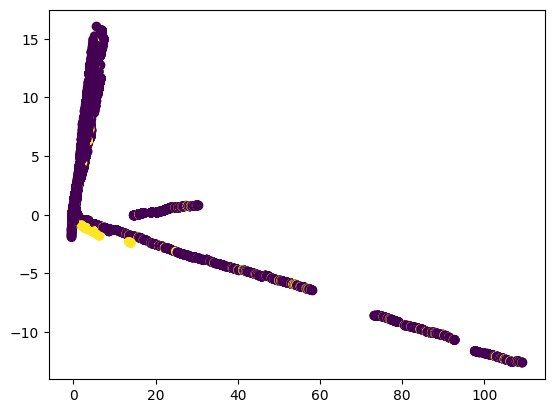

In [ ]:
x_std = pca.transform(transformed)
plt.figure()
plt.scatter(x_std[:, 0], x_std[:, 1], c=y.values)


## Second Method

First the features that will undergo PCA will be plotted to understand their relationships with other features.

C1-C14 features are plotted against each other as following.

Text(0.5, 1.0, 'C1 vs C2')

Text(0.5, 0, 'C1')

Text(0, 0.5, 'C2')

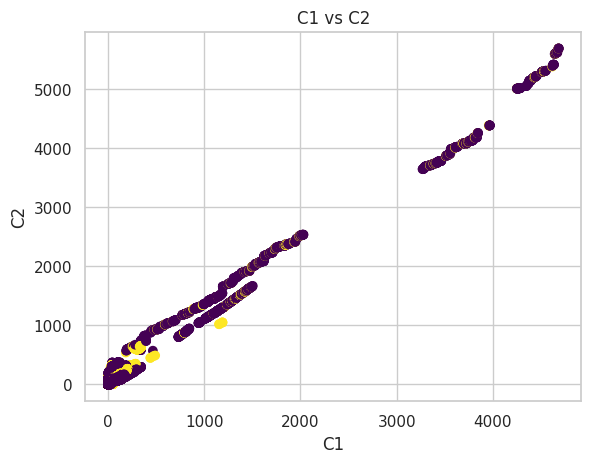

Text(0.5, 1.0, 'C3 vs C4')

Text(0.5, 0, 'C3')

Text(0, 0.5, 'C4')

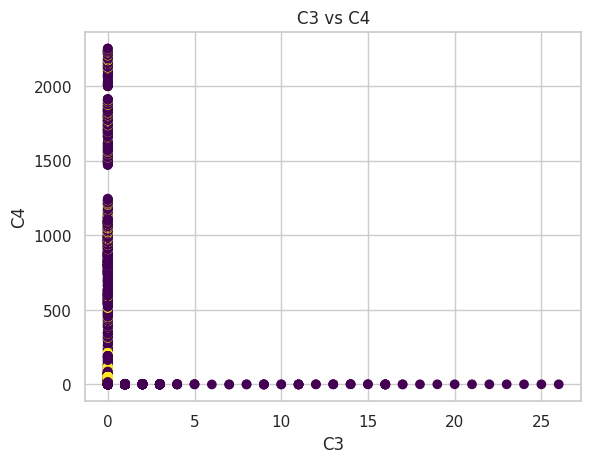

Text(0.5, 1.0, 'C5 vs C6')

Text(0.5, 0, 'C5')

Text(0, 0.5, 'C6')

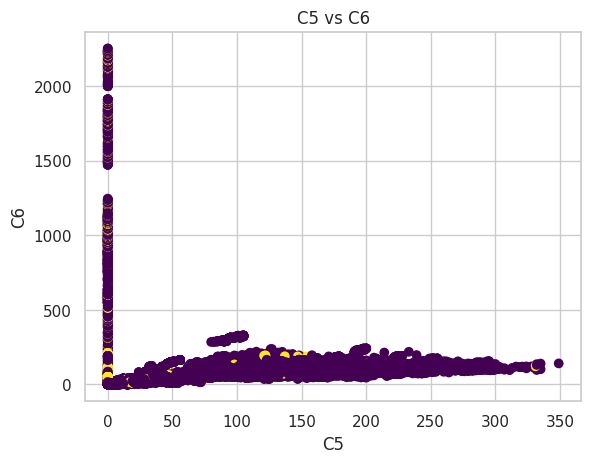

Text(0.5, 1.0, 'C7 vs C8')

Text(0.5, 0, 'C7')

Text(0, 0.5, 'C8')

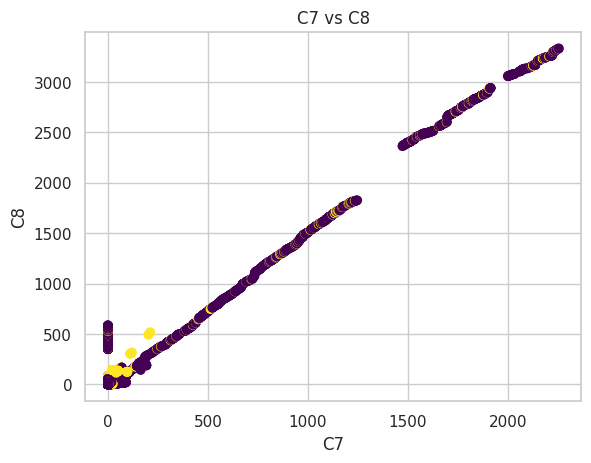

Text(0.5, 1.0, 'C9 vs C10')

Text(0.5, 0, 'C9')

Text(0, 0.5, 'C10')

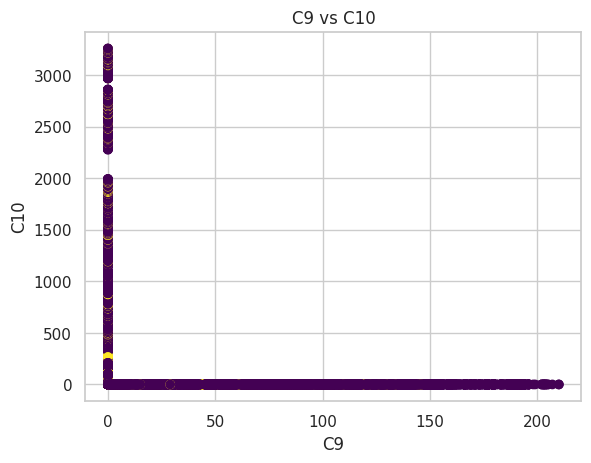

Text(0.5, 1.0, 'C11 vs C12')

Text(0.5, 0, 'C11')

Text(0, 0.5, 'C12')

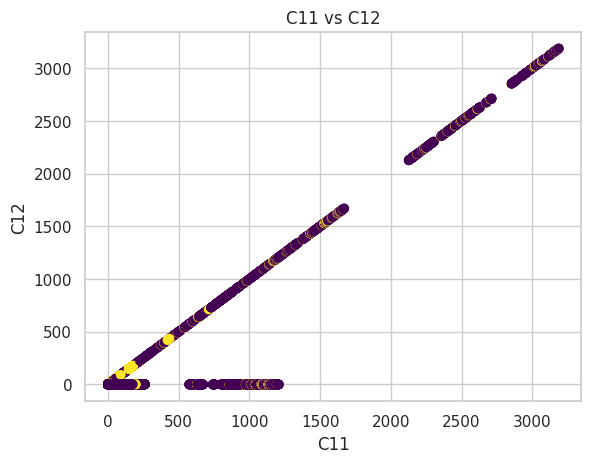

Text(0.5, 1.0, 'C13 vs C14')

Text(0.5, 0, 'C13')

Text(0, 0.5, 'C14')

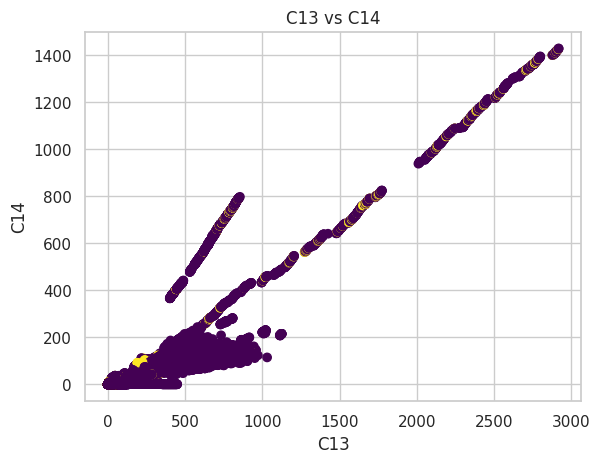

Text(0.5, 1.0, 'V1 vs V2')

Text(0.5, 0, 'V1')

Text(0, 0.5, 'V2')

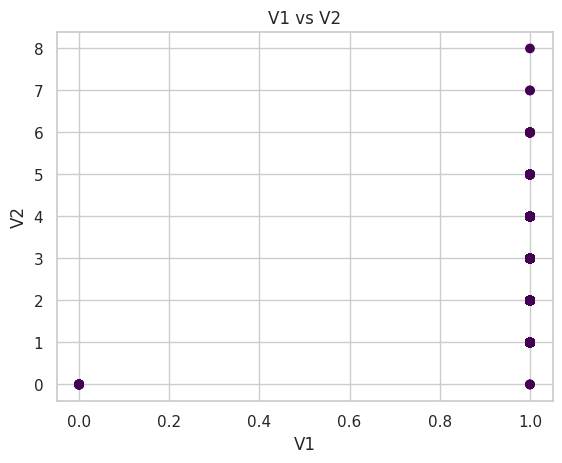

Text(0.5, 1.0, 'V3 vs V4')

Text(0.5, 0, 'V3')

Text(0, 0.5, 'V4')

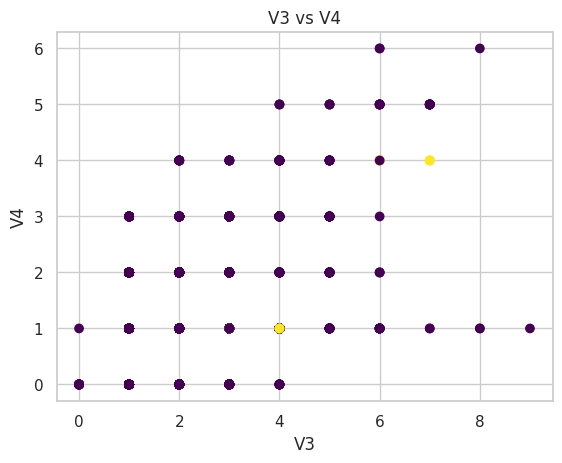

Text(0.5, 1.0, 'V5 vs V6')

Text(0.5, 0, 'V5')

Text(0, 0.5, 'V6')

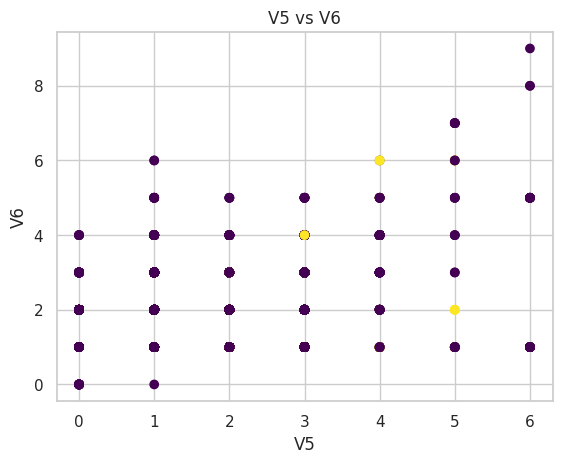

In [ ]:
X = updated_train_df.drop('isFraud', axis=1).values
y = updated_train_df['isFraud'].values
import matplotlib.pyplot as plt
plt.scatter(X[:, 5], X[:, 6], c=y, cmap='viridis')
plt.title('C1 vs C2')
plt.xlabel('C1')
plt.ylabel('C2')
plt.show()

plt.scatter(X[:, 7], X[:, 8], c=y, cmap='viridis')
plt.title('C3 vs C4')
plt.xlabel('C3')
plt.ylabel('C4')
plt.show()

plt.scatter(X[:, 9], X[:, 10], c=y, cmap='viridis')
plt.title('C5 vs C6')
plt.xlabel('C5')
plt.ylabel('C6')
plt.show()

plt.scatter(X[:, 11], X[:, 12], c=y, cmap='viridis')
plt.title('C7 vs C8')
plt.xlabel('C7')
plt.ylabel('C8')
plt.show()

plt.scatter(X[:, 13], X[:, 14], c=y, cmap='viridis')
plt.title('C9 vs C10')
plt.xlabel('C9')
plt.ylabel('C10')
plt.show()

plt.scatter(X[:, 15], X[:, 16], c=y, cmap='viridis')
plt.title('C11 vs C12')
plt.xlabel('C11')
plt.ylabel('C12')
plt.show()

plt.scatter(X[:, 17], X[:, 18], c=y, cmap='viridis')
plt.title('C13 vs C14')
plt.xlabel('C13')
plt.ylabel('C14')
plt.show()

plt.scatter(X[:, 36], X[:, 37], c=y, cmap='viridis')
plt.title('V1 vs V2')
plt.xlabel('V1')
plt.ylabel('V2')
plt.show()

plt.scatter(X[:, 38], X[:, 39], c=y, cmap='viridis')
plt.title('V3 vs V4')
plt.xlabel('V3')
plt.ylabel('V4')
plt.show()

plt.scatter(X[:, 40], X[:, 41], c=y, cmap='viridis')
plt.title('V5 vs V6')
plt.xlabel('V5')
plt.ylabel('V6')
plt.show()


Text(0.5, 1.0, 'C1 vs C2')

Text(0.5, 0, 'C1')

Text(0, 0.5, 'C2')

Text(0.5, 1.0, 'C3 vs C4')

Text(0.5, 0, 'C3')

Text(0, 0.5, 'C4')

Text(0.5, 1.0, 'C5 vs C6')

Text(0.5, 0, 'C5')

Text(0, 0.5, 'C6')

Text(0.5, 1.0, 'C7 vs C8')

Text(0.5, 0, 'C7')

Text(0, 0.5, 'C8')

Text(0.5, 1.0, 'C9 vs C10')

Text(0.5, 0, 'C9')

Text(0, 0.5, 'C10')

Text(0.5, 1.0, 'C11 vs C12')

Text(0.5, 0, 'C11')

Text(0, 0.5, 'C12')

Text(0.5, 1.0, 'C13 vs C14')

Text(0.5, 0, 'C13')

Text(0, 0.5, 'C14')

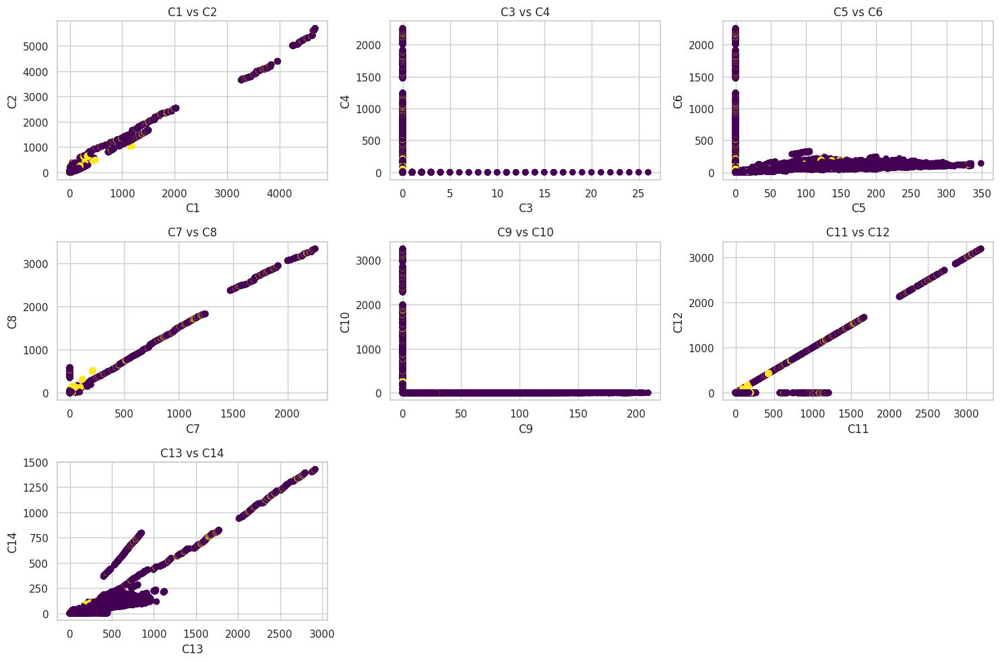

In [ ]:
import matplotlib.pyplot as plt

X = updated_train_df.drop('isFraud', axis=1).values
y = updated_train_df['isFraud'].values

fig = plt.figure(figsize=(15, 10))

# Subplot 1
ax1 = fig.add_subplot(3, 3, 1)
ax1.scatter(X[:, 5], X[:, 6], c=y, cmap='viridis')
ax1.set_title('C1 vs C2')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')

# Subplot 2
ax2 = fig.add_subplot(3, 3, 2)
ax2.scatter(X[:, 7], X[:, 8], c=y, cmap='viridis')
ax2.set_title('C3 vs C4')
ax2.set_xlabel('C3')
ax2.set_ylabel('C4')

# Subplot 3
ax3 = fig.add_subplot(3, 3, 3)
ax3.scatter(X[:, 9], X[:, 10], c=y, cmap='viridis')
ax3.set_title('C5 vs C6')
ax3.set_xlabel('C5')
ax3.set_ylabel('C6')

# Subplot 4
ax4 = fig.add_subplot(3, 3, 4)
ax4.scatter(X[:, 11], X[:, 12], c=y, cmap='viridis')
ax4.set_title('C7 vs C8')
ax4.set_xlabel('C7')
ax4.set_ylabel('C8')

# Subplot 5
ax5 = fig.add_subplot(3, 3, 5)
ax5.scatter(X[:, 13], X[:, 14], c=y, cmap='viridis')
ax5.set_title('C9 vs C10')
ax5.set_xlabel('C9')
ax5.set_ylabel('C10')

# Subplot 6
ax6 = fig.add_subplot(3, 3, 6)
ax6.scatter(X[:, 15], X[:, 16], c=y, cmap='viridis')
ax6.set_title('C11 vs C12')
ax6.set_xlabel('C11')
ax6.set_ylabel('C12')

# Subplot 6
ax7 = fig.add_subplot(3, 3, 7)
ax7.scatter(X[:, 17], X[:, 18], c=y, cmap='viridis')
ax7.set_title('C13 vs C14')
ax7.set_xlabel('C13')
ax7.set_ylabel('C14')

# Adjust layout
plt.tight_layout()
plt.show()


V-1V6 features are also plotted against each other as below.

Text(0.5, 1.0, 'V1 vs V2')

Text(0.5, 0, 'V1')

Text(0, 0.5, 'V2')

Text(0.5, 1.0, 'V3 vs V4')

Text(0.5, 0, 'V3')

Text(0, 0.5, 'V4')

Text(0.5, 1.0, 'V5 vs V6')

Text(0.5, 0, 'V5')

Text(0, 0.5, 'V6')

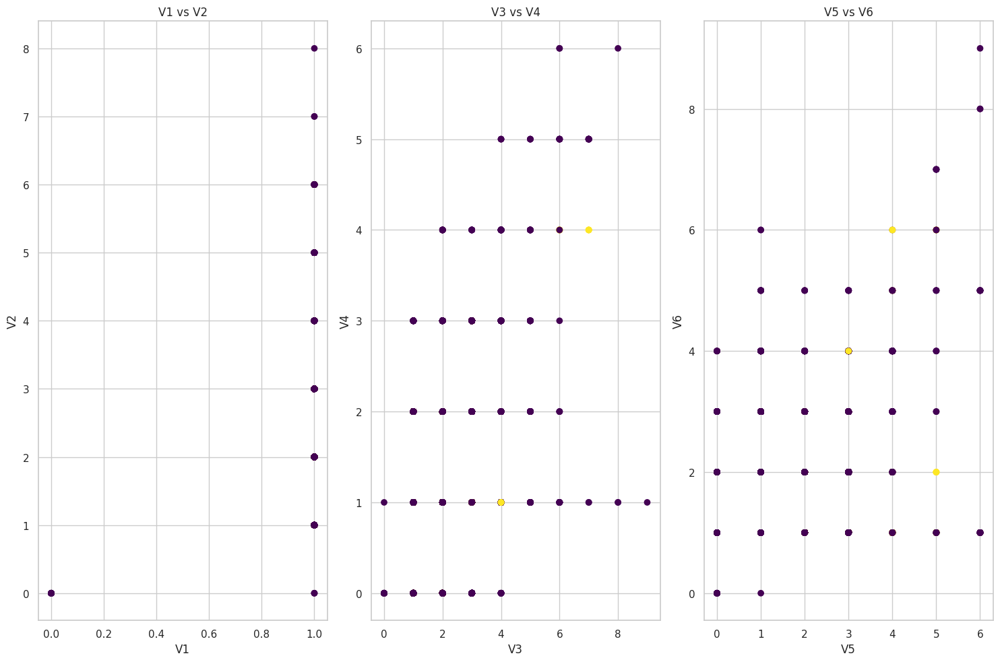

In [ ]:
import matplotlib.pyplot as plt

X = updated_train_df.drop('isFraud', axis=1).values
y = updated_train_df['isFraud'].values

fig = plt.figure(figsize=(15, 10))

# Subplot 1
ax1 = fig.add_subplot(1, 3, 1)
ax1.scatter(X[:, 36], X[:, 37], c=y, cmap='viridis')
ax1.set_title('V1 vs V2')
ax1.set_xlabel('V1')
ax1.set_ylabel('V2')

# Subplot 2
ax2 = fig.add_subplot(1, 3, 2)
ax2.scatter(X[:, 38], X[:, 39], c=y, cmap='viridis')
ax2.set_title('V3 vs V4')
ax2.set_xlabel('V3')
ax2.set_ylabel('V4')

# Subplot 3
ax3 = fig.add_subplot(1, 3, 3)
ax3.scatter(X[:, 40], X[:, 41], c=y, cmap='viridis')
ax3.set_title('V5 vs V6')
ax3.set_xlabel('V5')
ax3.set_ylabel('V6')


# Adjust layout
plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'C1 vs C8')

Text(0.5, 0, 'C1')

Text(0, 0.5, 'C8')

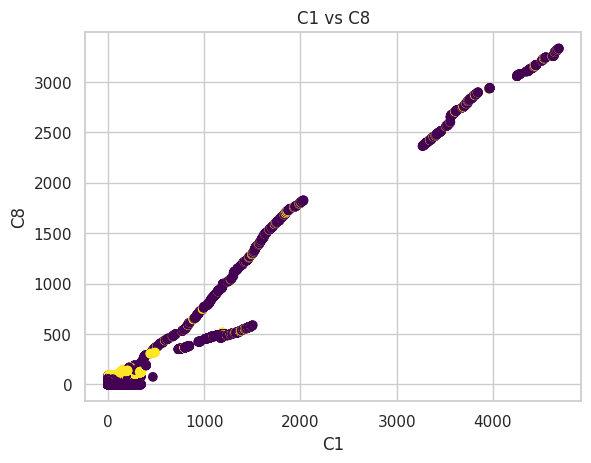

Text(0.5, 1.0, 'C2 vs C9')

Text(0.5, 0, 'C8')

Text(0, 0.5, 'C9')

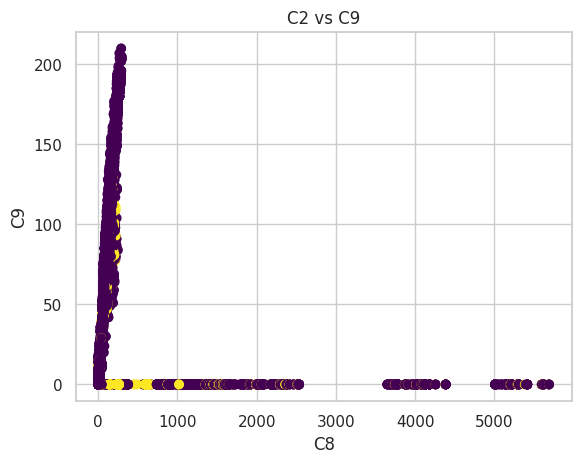

Text(0.5, 1.0, 'C3 vs C10')

Text(0.5, 0, 'C3')

Text(0, 0.5, 'C10')

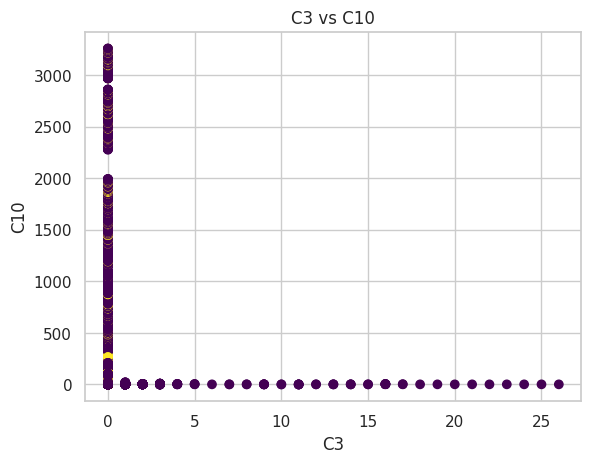

Text(0.5, 1.0, 'C4 vs C11')

Text(0.5, 0, 'C7')

Text(0, 0.5, 'C11')

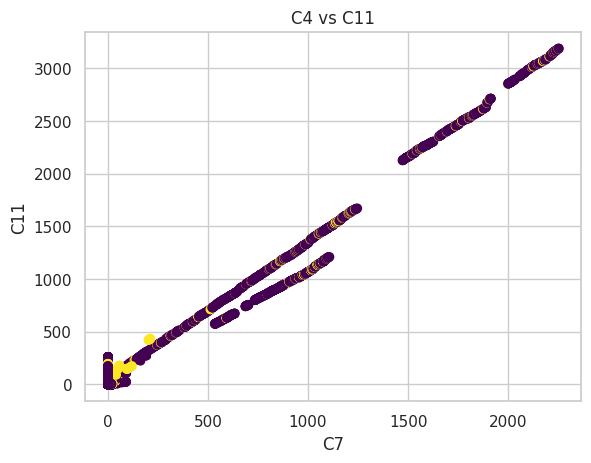

Text(0.5, 1.0, 'C5 vs C12')

Text(0.5, 0, 'C9')

Text(0, 0.5, 'C12')

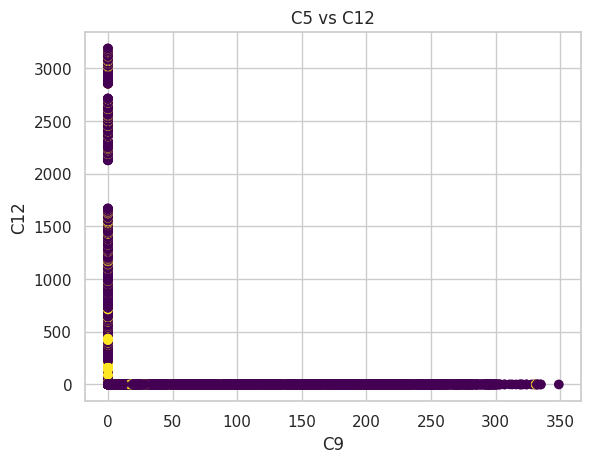

Text(0.5, 1.0, 'C6 vs C12')

Text(0.5, 0, 'C6')

Text(0, 0.5, 'C13')

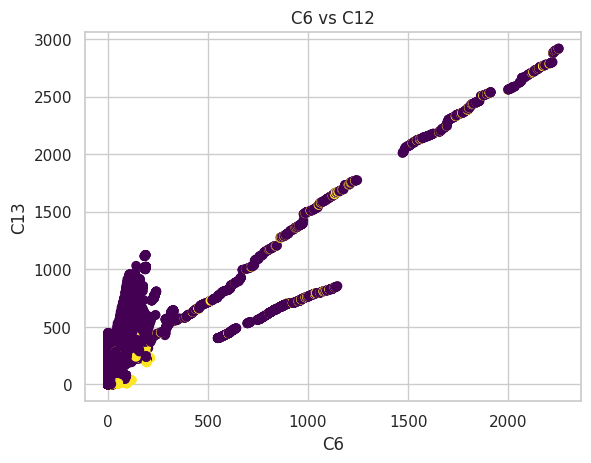

Text(0.5, 1.0, 'C7 vs C14')

Text(0.5, 0, 'C7')

Text(0, 0.5, 'C14')

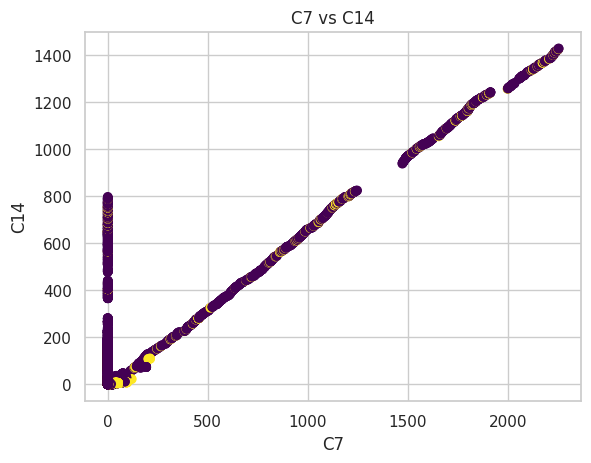

In [ ]:
X = updated_train_df.drop('isFraud', axis=1).values
y = updated_train_df['isFraud'].values
import matplotlib.pyplot as plt
plt.scatter(X[:, 5], X[:, 12], c=y, cmap='viridis')
plt.title('C1 vs C8')
plt.xlabel('C1')
plt.ylabel('C8')
plt.show()

plt.scatter(X[:, 6], X[:, 13], c=y, cmap='viridis')
plt.title('C2 vs C9')
plt.xlabel('C8')
plt.ylabel('C9')
plt.show()

plt.scatter(X[:, 7], X[:, 14], c=y, cmap='viridis')
plt.title('C3 vs C10')
plt.xlabel('C3')
plt.ylabel('C10')
plt.show()

plt.scatter(X[:, 8], X[:, 15], c=y, cmap='viridis')
plt.title('C4 vs C11')
plt.xlabel('C7')
plt.ylabel('C11')
plt.show()

plt.scatter(X[:, 9], X[:, 16], c=y, cmap='viridis')
plt.title('C5 vs C12')
plt.xlabel('C9')
plt.ylabel('C12')
plt.show()

plt.scatter(X[:, 10], X[:, 17], c=y, cmap='viridis')
plt.title('C6 vs C12')
plt.xlabel('C6')
plt.ylabel('C13')
plt.show()

plt.scatter(X[:, 11], X[:, 18], c=y, cmap='viridis')
plt.title('C7 vs C14')
plt.xlabel('C7')
plt.ylabel('C14')
plt.show()


Text(0.5, 1.0, 'C1 vs C8')

Text(0.5, 0, 'C1')

Text(0, 0.5, 'C8')

Text(0.5, 1.0, 'C2 vs C9')

Text(0.5, 0, 'C2')

Text(0, 0.5, 'C9')

Text(0.5, 1.0, 'C3 vs C10')

Text(0.5, 0, 'C3')

Text(0, 0.5, 'C10')

Text(0.5, 1.0, 'C4 vs C11')

Text(0.5, 0, 'C4')

Text(0, 0.5, 'C11')

Text(0.5, 1.0, 'C5 vs C12')

Text(0.5, 0, 'C5')

Text(0, 0.5, 'C12')

Text(0.5, 1.0, 'C6 vs C12')

Text(0.5, 0, 'C6')

Text(0, 0.5, 'C12')

Text(0.5, 1.0, 'C7 vs C14')

Text(0.5, 0, 'C7')

Text(0, 0.5, 'C14')

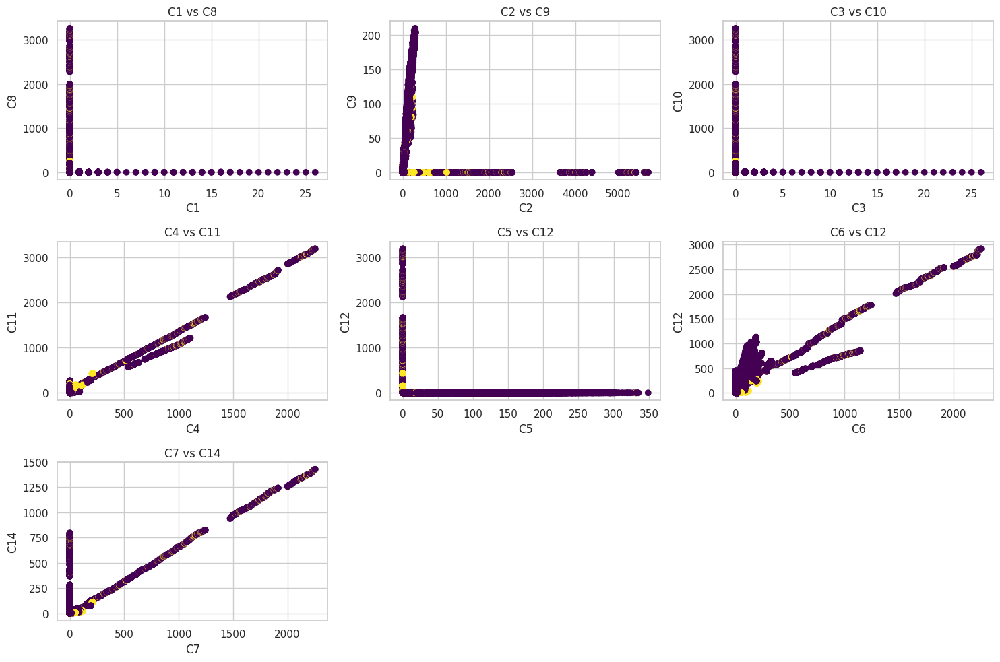

In [ ]:
import matplotlib.pyplot as plt

X = updated_train_df.drop('isFraud', axis=1).values
y = updated_train_df['isFraud'].values

fig = plt.figure(figsize=(15, 10))

# Subplot 1
ax1 = fig.add_subplot(3, 3, 1)
ax1.scatter(X[:, 7], X[:, 14], c=y, cmap='viridis')
ax1.set_title('C1 vs C8')
ax1.set_xlabel('C1')
ax1.set_ylabel('C8')

# Subplot 2
ax2 = fig.add_subplot(3, 3, 2)
ax2.scatter(X[:, 6], X[:, 13], c=y, cmap='viridis')
ax2.set_title('C2 vs C9')
ax2.set_xlabel('C2')
ax2.set_ylabel('C9')

# Subplot 3
ax3 = fig.add_subplot(3, 3, 3)
ax3.scatter(X[:, 7], X[:, 14], c=y, cmap='viridis')
ax3.set_title('C3 vs C10')
ax3.set_xlabel('C3')
ax3.set_ylabel('C10')

# Subplot 4
ax4 = fig.add_subplot(3, 3, 4)
ax4.scatter(X[:, 8], X[:, 15], c=y, cmap='viridis')
ax4.set_title('C4 vs C11')
ax4.set_xlabel('C4')
ax4.set_ylabel('C11')

# Subplot 5
ax5 = fig.add_subplot(3, 3, 5)
ax5.scatter(X[:, 9], X[:, 16], c=y, cmap='viridis')
ax5.set_title('C5 vs C12')
ax5.set_xlabel('C5')
ax5.set_ylabel('C12')

# Subplot 6
ax6 = fig.add_subplot(3, 3, 6)
ax6.scatter(X[:, 10], X[:, 17], c=y, cmap='viridis')
ax6.set_title('C6 vs C12')
ax6.set_xlabel('C6')
ax6.set_ylabel('C12')

# Subplot 6
ax7 = fig.add_subplot(3, 3, 7)
ax7.scatter(X[:, 11], X[:, 18], c=y, cmap='viridis')
ax7.set_title('C7 vs C14')
ax7.set_xlabel('C7')
ax7.set_ylabel('C14')

# Adjust layout
plt.tight_layout()
plt.show()


V1-V6 features are again plotted in 3D pane considering 3 features at once.

Text(0.5, 0.92, 'V1 vs V2 vs V3')

Text(0.5, 0, 'V1')

Text(0.5, 0.5, 'V2')

Text(0.5, 0, 'V3')

Text(0.5, 0.92, 'V4 vs V5 vs V6')

Text(0.5, 0, 'V4')

Text(0.5, 0.5, 'V5')

Text(0.5, 0, 'V6')

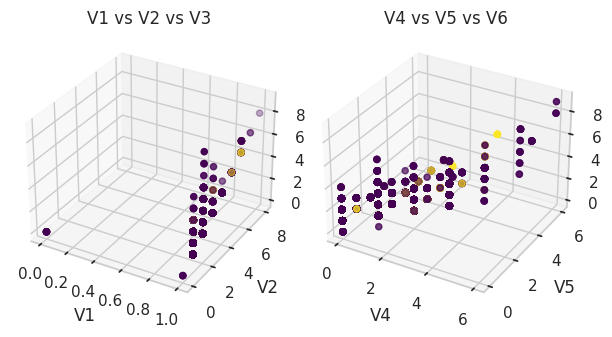

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Scatter plots in 3D
fig = plt.figure(figsize=(15, 15))

# Plot 1
ax1 = fig.add_subplot(3, 5, 1, projection='3d')
ax1.scatter(X[:, 36], X[:, 37], X[:, 38], c=y, cmap='viridis')
ax1.set_title('V1 vs V2 vs V3')
ax1.set_xlabel('V1')
ax1.set_ylabel('V2')
ax1.set_zlabel('V3')

# Plot 2
ax2 = fig.add_subplot(3, 5, 2, projection='3d')
ax2.scatter(X[:, 39], X[:, 40], X[:, 41], c=y, cmap='viridis')
ax2.set_title('V4 vs V5 vs V6')
ax2.set_xlabel('V4')
ax2.set_ylabel('V5')
ax2.set_zlabel('V6')



plt.tight_layout()
plt.show()


D1-D15 features are plotted in 3D panes taking 3 features at once.

Text(0.5, 0.92, 'D1 vs D2 vs D3')

Text(0.5, 0, 'D1')

Text(0.5, 0.5, 'D2')

Text(0.5, 0, 'D3')

Text(0.5, 0.92, 'D4 vs D5 vs D6')

Text(0.5, 0, 'D4')

Text(0.5, 0.5, 'D5')

Text(0.5, 0, 'D6')

Text(0.5, 0.92, 'D7 vs D8 vs D9')

Text(0.5, 0, 'D7')

Text(0.5, 0.5, 'D8')

Text(0.5, 0, 'D9')

Text(0.5, 0.92, 'D10 vs D11 vs D12')

Text(0.5, 0, 'D10')

Text(0.5, 0.5, 'D11')

Text(0.5, 0, 'D12')

Text(0.5, 0.92, 'D13 vs D14 vs D15')

Text(0.5, 0, 'D13')

Text(0.5, 0.5, 'D14')

Text(0.5, 0, 'D15')

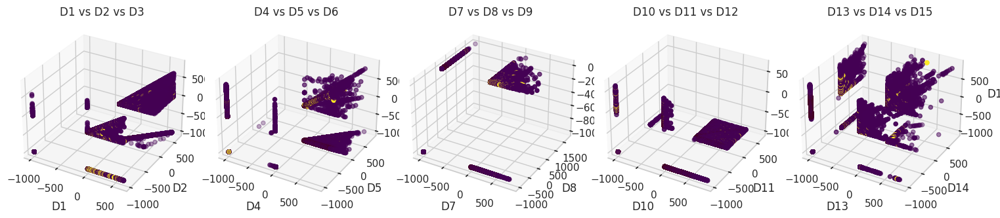

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Scatter plots in 3D
fig = plt.figure(figsize=(15, 15))

# Plot 1
ax1 = fig.add_subplot(3, 5, 1, projection='3d')
ax1.scatter(X[:, 19], X[:, 20], X[:, 21], c=y, cmap='viridis')
ax1.set_title('D1 vs D2 vs D3')
ax1.set_xlabel('D1')
ax1.set_ylabel('D2')
ax1.set_zlabel('D3')

# Plot 2
ax2 = fig.add_subplot(3, 5, 2, projection='3d')
ax2.scatter(X[:, 22], X[:, 23], X[:, 24], c=y, cmap='viridis')
ax2.set_title('D4 vs D5 vs D6')
ax2.set_xlabel('D4')
ax2.set_ylabel('D5')
ax2.set_zlabel('D6')

# Plot 3
ax3 = fig.add_subplot(3, 5, 3, projection='3d')
ax3.scatter(X[:, 25], X[:, 26], X[:, 27], c=y, cmap='viridis')
ax3.set_title('D7 vs D8 vs D9')
ax3.set_xlabel('D7')
ax3.set_ylabel('D8')
ax3.set_zlabel('D9')

# Plot 4
ax4 = fig.add_subplot(3, 5, 4, projection='3d')
ax4.scatter(X[:, 28], X[:, 29], X[:, 30], c=y, cmap='viridis')
ax4.set_title('D10 vs D11 vs D12')
ax4.set_xlabel('D10')
ax4.set_ylabel('D11')
ax4.set_zlabel('D12')

# Plot 5
ax5 = fig.add_subplot(3, 5, 5, projection='3d')
ax5.scatter(X[:, 31], X[:, 32], X[:, 33], c=y, cmap='viridis')
ax5.set_title('D13 vs D14 vs D15')
ax5.set_xlabel('D13')
ax5.set_ylabel('D14')
ax5.set_zlabel('D15')

plt.tight_layout()
plt.show()


Next plots will be drawn to identify what differences will it make to the dataset before adding new features of PCA to the dataset. PCA is applied on the features of C1-C14, D1-D15 and V1-V6 and plotted to see their behaviour in following section.

In [ ]:
counts_subset = updated_train_df[["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14"]]
one_two = updated_train_df[["C1", "C2"]]
y = updated_train_df['isFraud'].values

First C1-C14 will undergo PCA technique. I decided to create 2 principal component for C1-C14 features.
Following creating the principal components, PCA1 and PCA2 are plotted against them to observe their behaviour.

Text(0.5, 0, 'Principal Component 1')

Text(0, 0.5, 'Principal Component 2')

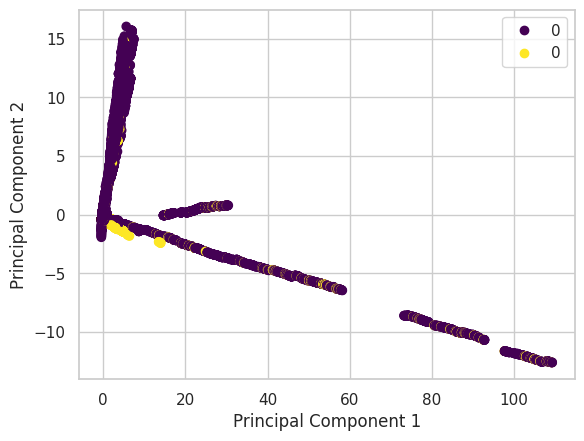

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])

# Fit and transform the data using the pipeline
Xt = pipe.fit_transform(counts_subset)

# Create a scatter plot
plot = plt.scatter(Xt[:, 0], Xt[:, 1], c=y, cmap='viridis')

# Add labels to the axes
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Add a legend
plt.legend(handles=plot.legend_elements()[0], labels=list(updated_train_df['isFraud']))

# Show the plot
plt.show()


Next, PCa is applied on V1-V6 features. Only one principal component is created for these features.

Text(0.5, 0, 'Principal Component 1')

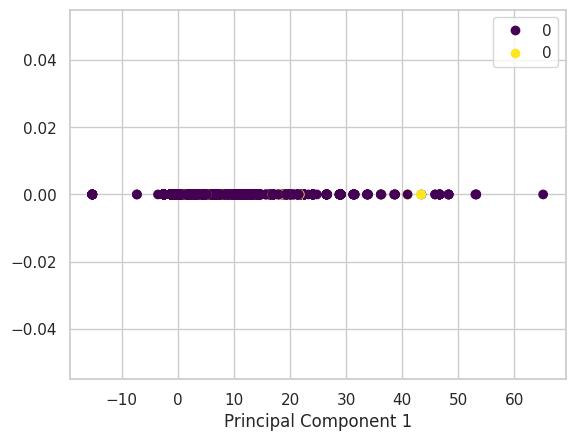

In [ ]:
V_features_subset = updated_train_df[["V1", "V2", "V3", "V4", "V5", "V6"]]

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
pca = PCA(n_components=1)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
Xt = pipe.fit_transform(V_features_subset)
plot = plt.scatter(Xt[:, 0], np.zeros_like(Xt[:, 0]), c=y, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.legend(handles=plot.legend_elements()[0], labels=list(updated_train_df['isFraud']))
plt.show()

Lastly, PCA is applied to features of D1-D15 and it will also have only one principal components.

Text(0.5, 0, 'Principal Component 1')

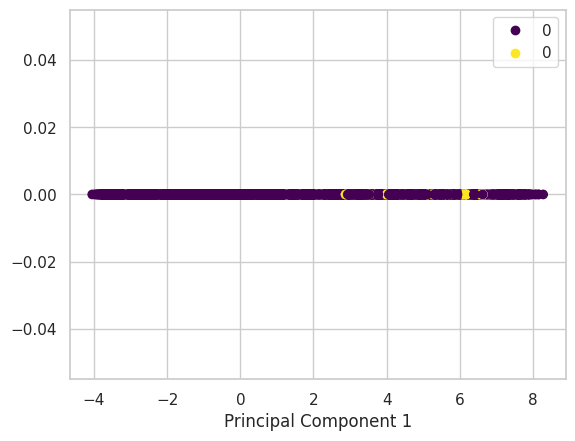

In [ ]:
date_count_subset = updated_train_df[["D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12","D13", "D14", "D15"]]

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
pca = PCA(n_components=1)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
Xt = pipe.fit_transform(date_count_subset)
plot = plt.scatter(Xt[:, 0], np.zeros_like(Xt[:, 0]), c=y, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.legend(handles=plot.legend_elements()[0], labels=list(updated_train_df['isFraud']))
plt.show()

As the plots of the PCA components are showcasing good interpretability, principal components are next added to the dataset.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assume card_features, count_features, time_diff_features, etc., are your separate feature groups
counts_subset = updated_train_df[["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14"]]
date_count_subset = updated_train_df[["D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12","D13", "D14", "D15"]]
V_features_subset = updated_train_df[["V1", "V2", "V3", "V4", "V5", "V6"]]

# Standardize the data
scaler = StandardScaler()
counts_subset_std = scaler.fit_transform(counts_subset)
V_features_subset_std = scaler.fit_transform(V_features_subset)
date_count_subset_std = scaler.fit_transform(date_count_subset)

# Apply PCA
pca_counts_subset = PCA(n_components=2)
counts_subset_pca_features = pca_counts_subset.fit_transform(counts_subset_std)

pca_date_counts_subset = PCA(n_components=1)
date_counts_subset_pca_features = pca_date_counts_subset.fit_transform(date_count_subset_std)

pca_V_features_subset = PCA(n_components=1)
V_features_subset_pca_features = pca_V_features_subset.fit_transform(V_features_subset_std)

# Combine the new features
new_features = np.concatenate(( counts_subset_pca_features, V_features_subset_pca_features, date_counts_subset_pca_features, ), axis=1)


In [ ]:
new_features

array([[-0.3312725 , -0.3342733 , -0.02151782, -0.41754092],
       [-0.33828164, -0.370772  , -0.02151782,  0.27416879],
       [-0.33458935, -0.33419258, -0.02151782, -0.53292301],
       ...,
       [-0.33225311, -0.31053581, -0.02151782, -0.20846778],
       [-0.3111213 , -0.28656187,  2.49373624, -1.44532543],
       [-0.32621842, -0.27405267, -0.02151782, -0.97018457]])

In [ ]:
# Add PCA-transformed features to the DataFrame
updated_train_df["V_features_subset_pca"] = V_features_subset_pca_features[:, 0]

updated_train_df["counts_subset_pca_1"] = counts_subset_pca_features[:, 0]
updated_train_df["counts_subset_pca_2"] = counts_subset_pca_features[:, 1]

updated_train_df["date_counts_subset_pca"] = date_counts_subset_pca_features[:, 0]

In [ ]:
updated_train_df.head()

,isFraud,TransactionAmt,card4,card6,dist1,dist2,C1,C2,C3,C4,...,V3,V4,V5,V6,card_bank_feature,addr_concat,V_features_subset_pca,counts_subset_pca_1,counts_subset_pca_2,date_counts_subset_pca
0,0,68.5,2,2,19.0,-999.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,27,12,-0.021518,-0.331272,-0.334273,-0.417541
1,0,29.0,3,2,-999.0,-999.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,17,13,-0.021518,-0.338282,-0.370772,0.274169
2,0,59.0,4,3,287.0,-999.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,17,14,-0.021518,-0.334589,-0.334193,-0.532923
3,0,50.0,3,3,-999.0,-999.0,2.0,5.0,0.0,0.0,...,1.0,1.0,1.0,1.0,18,16,-0.021518,-0.264718,-0.264662,-1.199767
4,0,50.0,3,2,-999.0,-999.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,13,16,-0.021518,-0.331892,-0.373663,1.716602


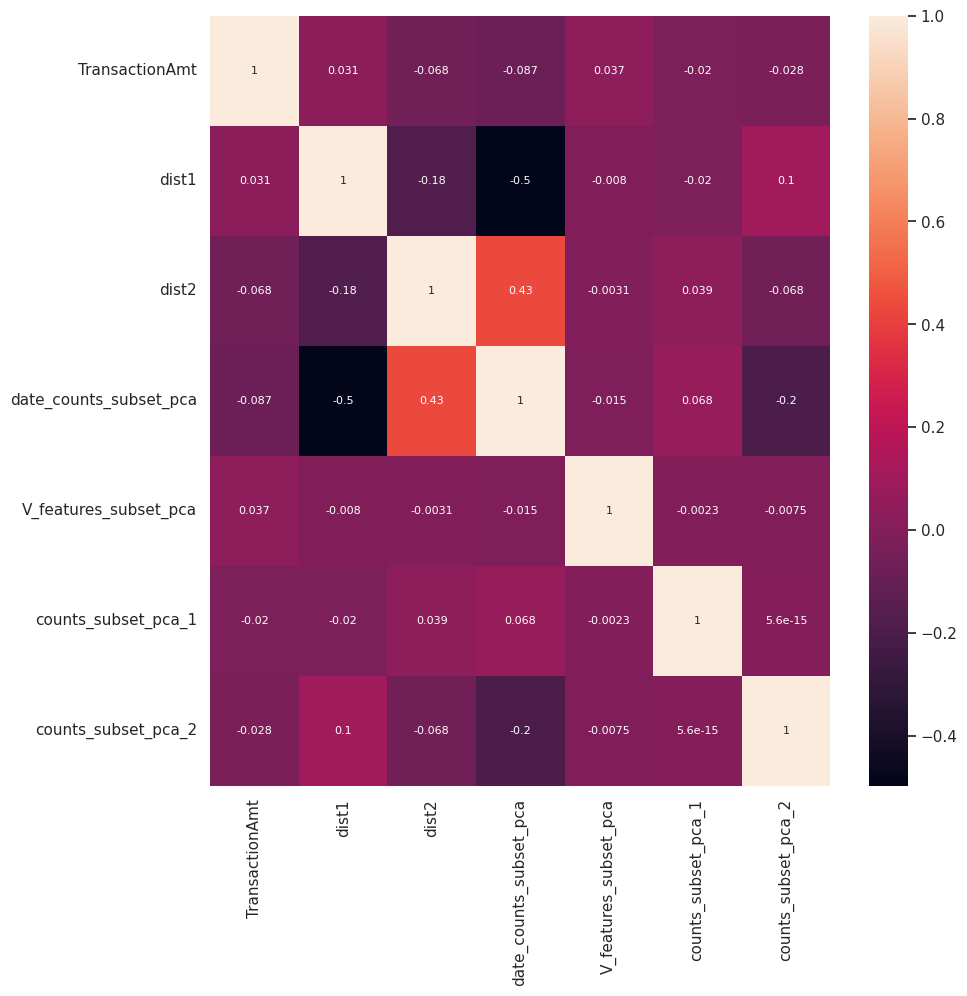

In [ ]:
corr_data = updated_train_df[["TransactionAmt", "dist1", "dist2",
                      "date_counts_subset_pca",
                      "V_features_subset_pca", "counts_subset_pca_1", "counts_subset_pca_2"]]
corr = corr_data.corr()
plt.figure(figsize=(10, 10))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

After adding the new created principal components to the dataset, the original features are dropped from the dataset.

In [ ]:
updated_train_df = updated_train_df.drop(columns=["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14",
                                                  "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12","D13", "D14", "D15",
                                         "V1", "V2", "V3", "V4", "V5", "V6"], axis=1)

In [ ]:
updated_train_df.shape
updated_train_df.columns.tolist()

(590540, 14)

['isFraud',
 'TransactionAmt',
 'card4',
 'card6',
 'dist1',
 'dist2',
 'M1',
 'M2',
 'card_bank_feature',
 'addr_concat',
 'V_features_subset_pca',
 'counts_subset_pca_1',
 'counts_subset_pca_2',
 'date_counts_subset_pca']

# Apply sampling technique to the dataset after applying PCA

In [ ]:
#Keeping a complete dataset
updated_train_df.to_csv('with_PCA.csv', index=False)

I am applying under-sampling technique in this section. I will create 3 datasets of 1:9, 1:3 and 1:1 ratios of fraud:normal transactions.

1:9 Ratio Dataset

In [ ]:
# Separate data into two DataFrames by class
class_0_data = updated_train_df[updated_train_df['isFraud'] == 0]
class_1_data = updated_train_df[updated_train_df['isFraud'] == 1]

# Randomly undersample the majority class
undersampled_class_0 = class_0_data.sample(n=18000, random_state=42)

# Randomly undersample the majority class
undersampled_class_1 = class_1_data.sample(n=2000, random_state=42)

# Combine the minority class and undersampled majority class DataFrames
balanced_data = pd.concat([undersampled_class_1, undersampled_class_0])

# Shuffle the balanced dataset
balanced_data = balanced_data.sample(frac=1, random_state=42)


In [ ]:
# Check the class distribution
balanced_counts = balanced_data['isFraud'].value_counts()
print(balanced_counts)
print('\n')
balanced_data.head()

0    18000
1     2000
Name: isFraud, dtype: int64




,isFraud,TransactionAmt,card4,card6,dist1,dist2,M1,M2,card_bank_feature,addr_concat,V_features_subset_pca,counts_subset_pca_1,counts_subset_pca_2,date_counts_subset_pca
24874,0,47.95,4,3,8.0,-999.0,1,1,26,16,-0.021518,-0.312887,-0.257262,-1.610817
234763,0,44.00,3,3,-999.0,-999.0,2,2,18,16,-0.021518,-0.338282,-0.370772,0.274169
10731,0,50.00,1,2,-999.0,-999.0,2,2,27,12,-0.021518,-0.327509,-0.375458,3.479421
371829,1,545.00,3,3,-999.0,-999.0,1,1,22,16,-0.021518,-0.333539,-0.303748,-0.968741
544485,0,97.00,4,3,-999.0,-999.0,1,1,26,16,-0.021518,-0.310611,-0.291493,-0.677499


In [ ]:
balanced_data.to_csv('CNP_fraud_1to9_balanced_dataset_train.csv', index=False)

1:3 Ratio Dataset

In [ ]:
# Separate data into two DataFrames by class
class_0_data = updated_train_df[updated_train_df['isFraud'] == 0]
class_1_data = updated_train_df[updated_train_df['isFraud'] == 1]

# Randomly undersample the majority class
undersampled_class_0 = class_0_data.sample(n=9000, random_state=42)

# Randomly undersample the majority class
undersampled_class_1 = class_1_data.sample(n=3000, random_state=42)

# Combine the minority class and undersampled majority class DataFrames
balanced_data = pd.concat([undersampled_class_1, undersampled_class_0])

# Shuffle the balanced dataset
balanced_data = balanced_data.sample(frac=1, random_state=42)


In [ ]:
# Check the class distribution
balanced_counts = balanced_data['isFraud'].value_counts()
print(balanced_counts)
print('\n')
balanced_data.head()

0    9000
1    3000
Name: isFraud, dtype: int64




,isFraud,TransactionAmt,card4,card6,dist1,dist2,M1,M2,card_bank_feature,addr_concat,V_features_subset_pca,counts_subset_pca_1,counts_subset_pca_2,date_counts_subset_pca
207173,1,66.812,4,3,-999.0,744.0,2,2,26,20,-0.021518,-0.319310,-0.379374,3.833844
501068,0,108.950,4,3,-999.0,-999.0,1,0,19,11,-0.021518,-0.245375,-0.147893,-2.278037
494073,1,44.266,3,2,-999.0,-999.0,2,2,26,20,-0.021518,4.791077,-1.409629,6.199790
91956,0,50.000,4,3,-999.0,-999.0,2,2,26,14,-0.021518,-0.327509,-0.375458,3.627164
230444,1,554.000,4,2,-999.0,-999.0,2,2,23,16,-0.021518,-0.350566,-0.377166,0.553983


In [ ]:
balanced_data.to_csv('CNP_fraud_1to3_balanced_dataset_train.csv', index=False)

1:1 Dataset Ratio

In [ ]:
# Separate data into two DataFrames by class
class_0_data = updated_train_df[updated_train_df['isFraud'] == 0]
class_1_data = updated_train_df[updated_train_df['isFraud'] == 1]

# Randomly undersample the majority class
undersampled_class_0 = class_0_data.sample(n=5000, random_state=42)

# Randomly undersample the majority class
undersampled_class_1 = class_1_data.sample(n=5000, random_state=42)

# Combine the minority class and undersampled majority class DataFrames
balanced_data = pd.concat([undersampled_class_1, undersampled_class_0])

# Shuffle the balanced dataset
balanced_data = balanced_data.sample(frac=1, random_state=42)


In [ ]:
# Check the class distribution
balanced_counts = balanced_data['isFraud'].value_counts()
print(balanced_counts)
print('\n')
balanced_data.head()

0    5000
1    5000
Name: isFraud, dtype: int64




,isFraud,TransactionAmt,card4,card6,dist1,dist2,M1,M2,card_bank_feature,addr_concat,V_features_subset_pca,counts_subset_pca_1,counts_subset_pca_2,date_counts_subset_pca
23494,0,40.000,4,3,-999.0,-999.0,2,2,17,16,-0.021518,-0.263179,-0.161660,-2.135398
327913,1,42.415,4,3,-999.0,530.0,2,2,19,20,-0.021518,-0.245515,-0.394887,6.198325
458840,1,335.000,4,3,2351.0,-999.0,1,1,16,16,-0.021518,-0.285057,-0.279560,-1.952529
185178,1,146.000,4,3,229.0,-999.0,1,0,19,16,-0.021518,-0.211242,0.121364,-2.402403
511628,1,49.000,4,3,-999.0,-999.0,2,2,26,16,-0.021518,-0.346261,-0.376565,0.022479


In [ ]:
balanced_data.to_csv('CNP_fraud_1to1_balanced_dataset_train.csv', index=False)

# Without PCA

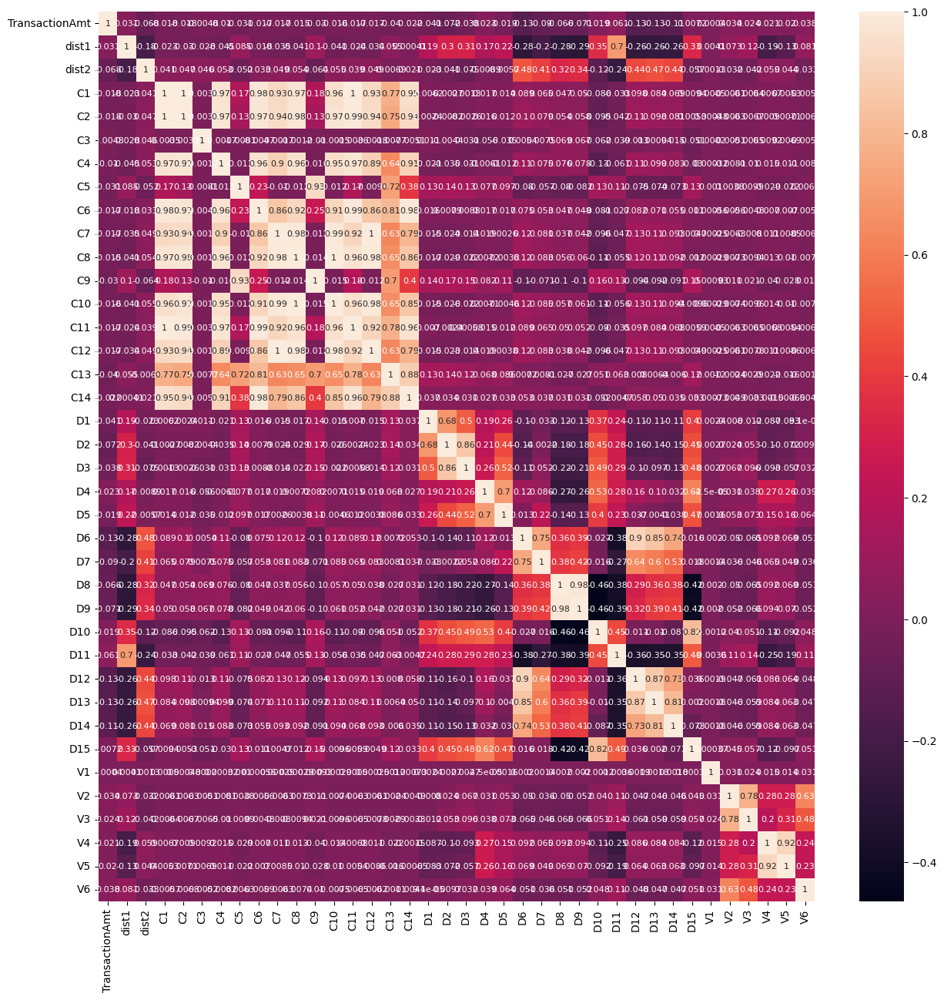

In [ ]:
corr_data = updated_train_df_encoded[["TransactionAmt", "dist1", "dist2",
                                      "C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14",
                                      "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12", "D13", "D14", "D15",
                                      "V1", "V2", "V3", "V4", "V5", "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

In [ ]:
updated_train_df_encoded = updated_train_df_encoded.drop(columns= ['card2', 'card3', 'card5', 'addr1', 'addr2'])

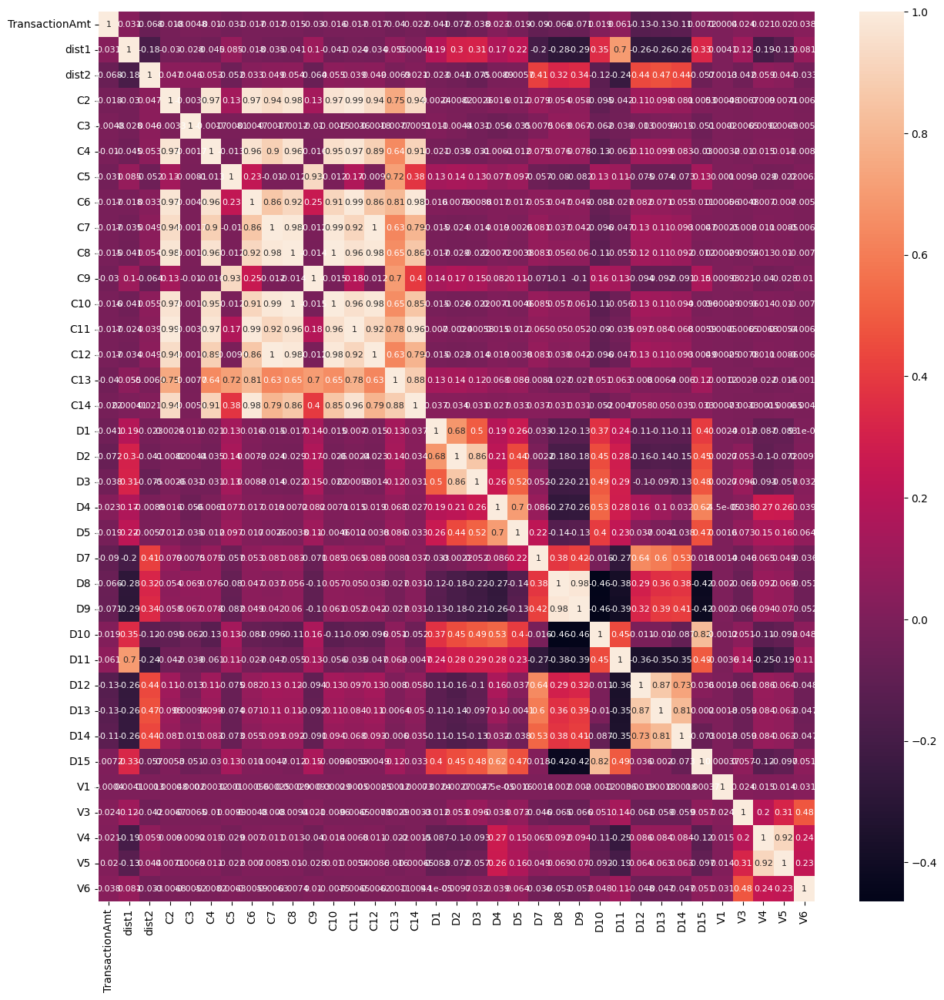

In [ ]:
train_df_without_pca = updated_train_df_encoded.drop(columns=['C1', 'D6', 'V2'], axis=1)
corr_data = updated_train_df_encoded[["TransactionAmt", "dist1", "dist2",
                                      "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14",
                                      "D1", "D2", "D3", "D4", "D5", "D7", "D8", "D9", "D10", "D11", "D12", "D13", "D14", "D15",
                                      "V1", "V3", "V4", "V5", "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

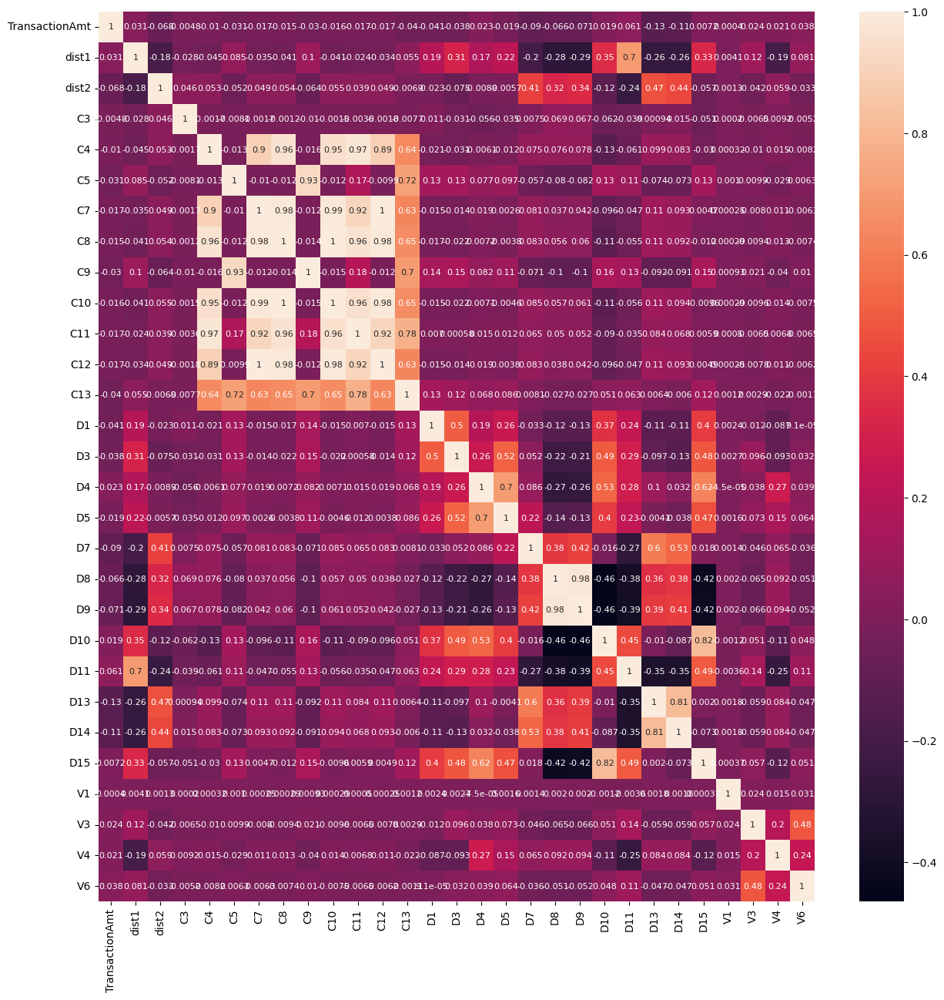

In [ ]:
train_df_without_pca = updated_train_df_encoded.drop(columns=['C2', 'C6', 'C14', 'D2','D12', 'V5'], axis=1)
corr_data = updated_train_df_encoded[["TransactionAmt", "dist1", "dist2",
                                      "C3", "C4", "C5", "C7", "C8", "C9", "C10", "C11", "C12", "C13",
                                      "D1", "D3", "D4", "D5", "D7", "D8", "D9", "D10", "D11",  "D13", "D14", "D15",
                                      "V1", "V3", "V4",  "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

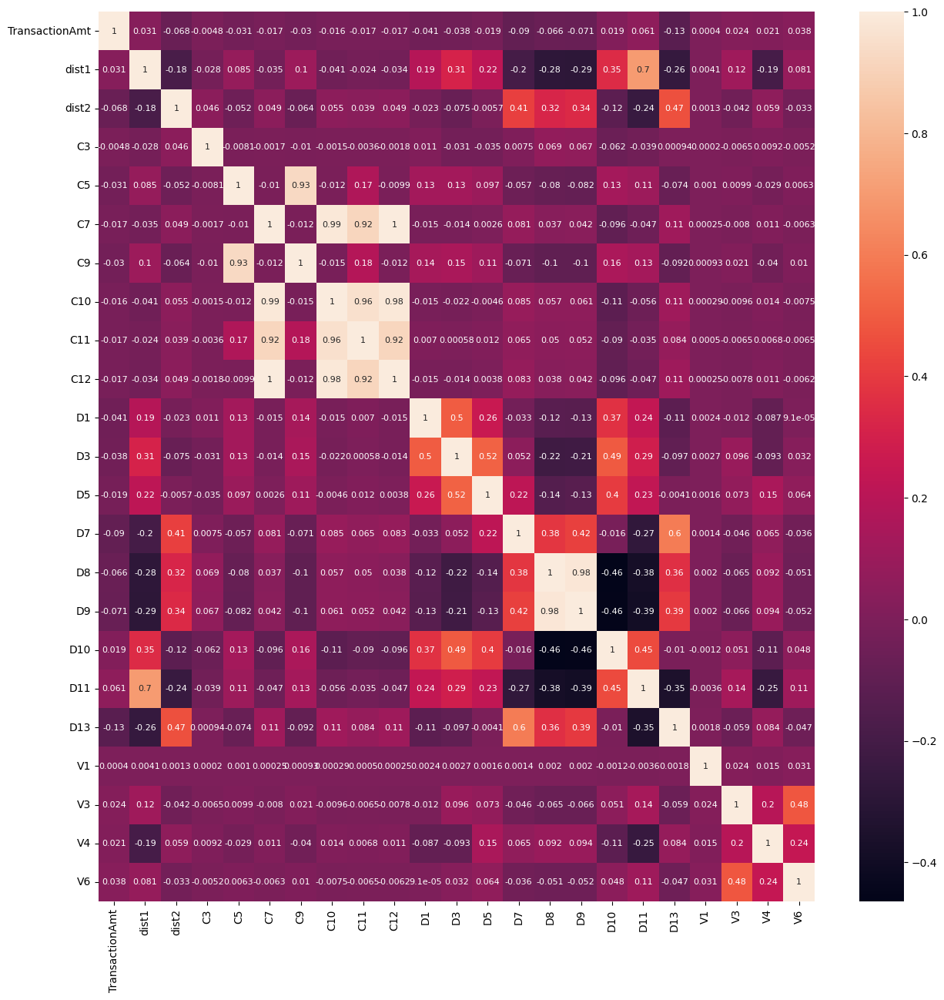

In [ ]:
train_df_without_pca = updated_train_df_encoded.drop(columns=['C4', 'C8', 'C13', 'D4', 'D14', 'D15'], axis=1)
corr_data = updated_train_df_encoded[["TransactionAmt", "dist1", "dist2",
                                      "C3", "C5", "C7", "C9", "C10", "C11", "C12",
                                      "D1", "D3", "D5", "D7", "D8", "D9", "D10", "D11",  "D13",
                                      "V1", "V3", "V4",  "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

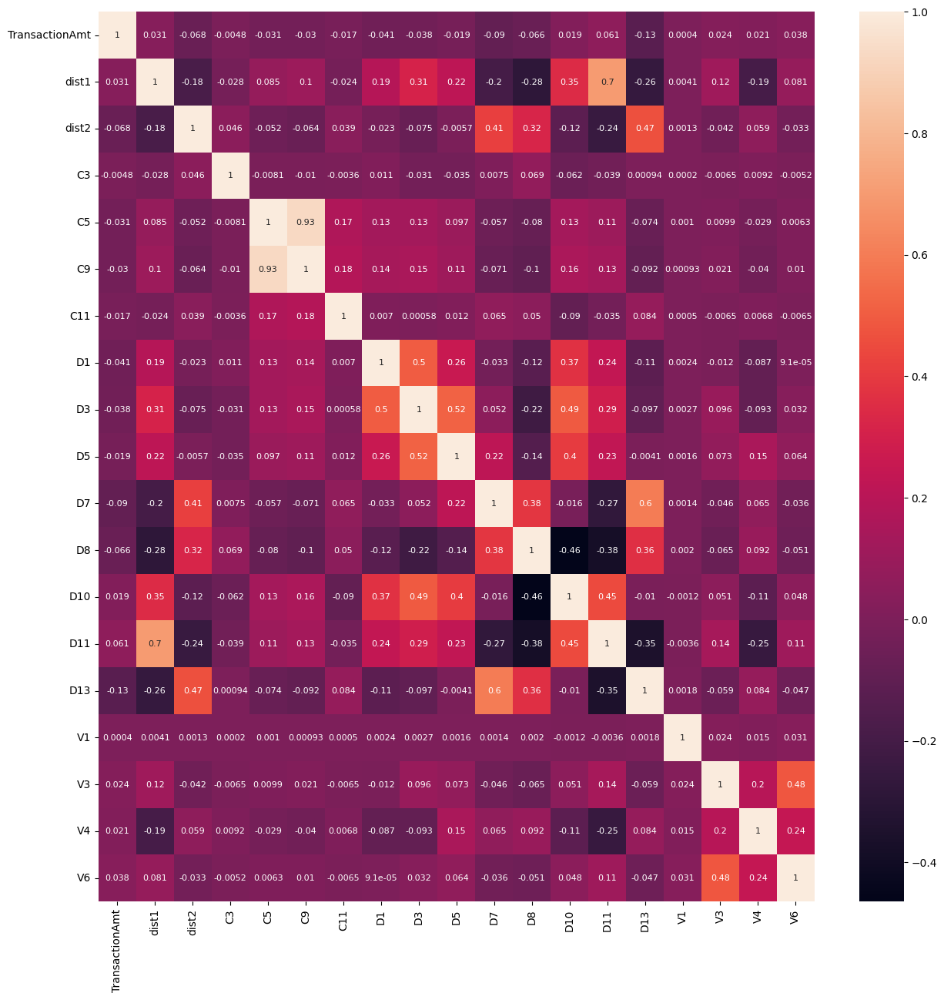

In [ ]:
train_df_without_pca = updated_train_df_encoded.drop(columns=['C10', 'C12', 'C7', 'D9'], axis=1)
corr_data = updated_train_df_encoded[["TransactionAmt", "dist1", "dist2",
                                      "C3", "C5", "C9", "C11",
                                      "D1", "D3", "D5", "D7", "D8", "D10", "D11",  "D13",
                                      "V1", "V3", "V4",  "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

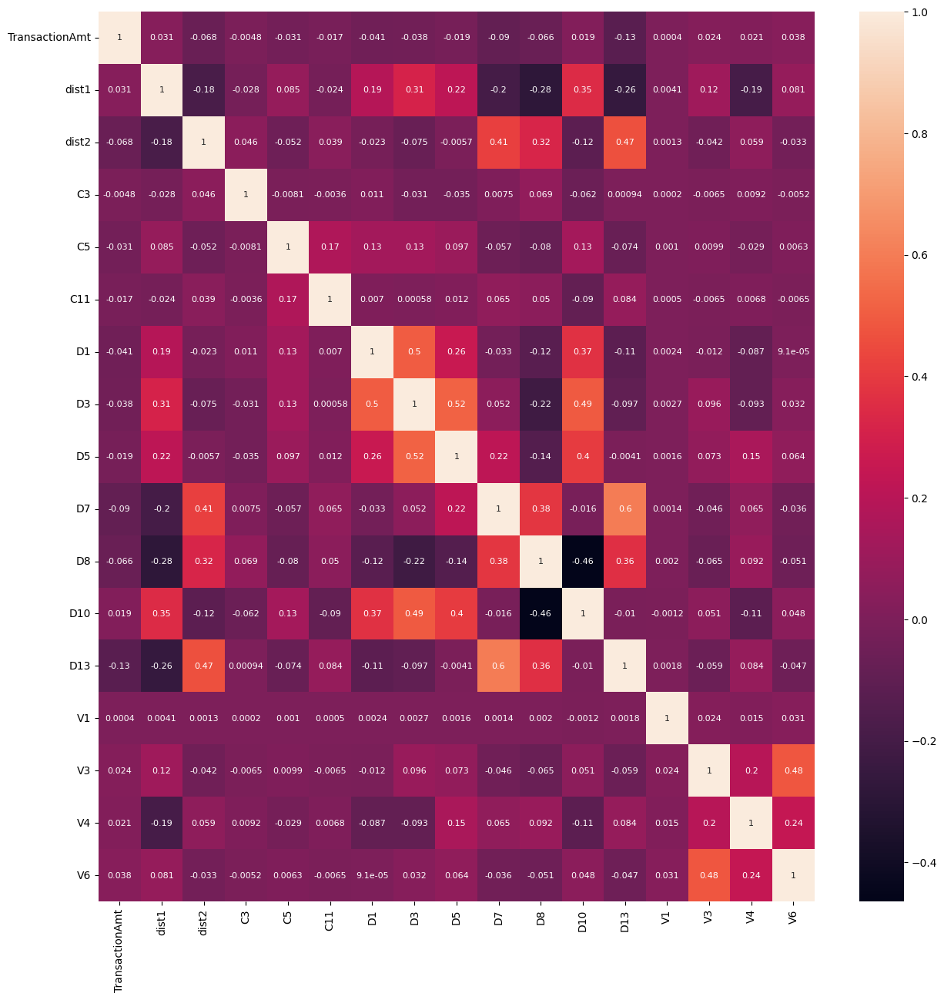

In [ ]:
train_df_without_pca = updated_train_df_encoded.drop(columns=['C9', 'D11'], axis=1)
corr_data = updated_train_df_encoded[["TransactionAmt", "dist1", "dist2",
                                      "C3", "C5", "C11",
                                      "D1", "D3", "D5", "D7", "D8", "D10", "D13",
                                      "V1", "V3", "V4",  "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

In [ ]:
train_df_without_pca = updated_train_df_encoded.drop(columns=['C1', 'C2', 'C4', 'C9', 'C6', 'C7', 'C8', 'C10', 'C12', 'C13', 'C14',
                                               'D2', 'D4', 'D6', 'D9',  'D11','D12', 'D14', 'D15',
                                              'V2', 'V5'], axis=1)

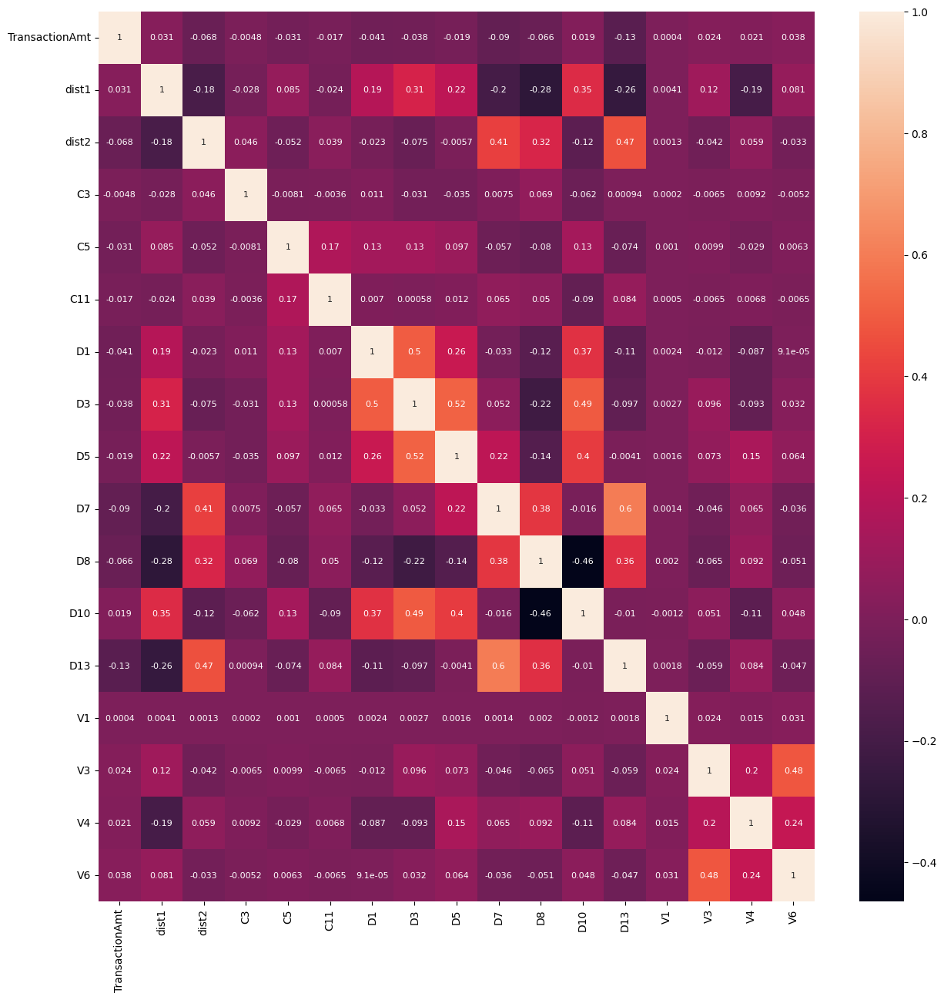

In [ ]:
corr_data = train_df_without_pca[["TransactionAmt", "dist1", "dist2",
                                      "C3", "C5", "C11",
                                      "D1", "D3", "D5", "D7", "D8", "D10", "D13",
                                      "V1", "V3", "V4",  "V6"]]
corr = corr_data.corr()
plt.figure(figsize=(15, 15))
cor_plot = sns.heatmap(corr, annot=True, annot_kws={"fontsize": 8})
plt.show();

In [ ]:
#Count missing values
missing_values_without_pca  = train_df_without_pca.isnull().sum()

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the missing values
print(missing_values_without_pca)

# Reset display options to default (if needed)
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')


isFraud              0
TransactionAmt       0
card4                0
card6                0
dist1                0
dist2                0
C3                   0
C5                   0
C11                  0
D1                   0
D3                   0
D5                   0
D7                   0
D8                   0
D10                  0
D13                  0
M1                   0
M2                   0
V1                   0
V3                   0
V4                   0
V6                   0
card_bank_feature    0
addr_concat          0
dtype: int64


In [ ]:
train_df_without_pca.columns.tolist()

['isFraud',
 'TransactionAmt',
 'card4',
 'card6',
 'dist1',
 'dist2',
 'C3',
 'C5',
 'C11',
 'D1',
 'D3',
 'D5',
 'D7',
 'D8',
 'D10',
 'D13',
 'M1',
 'M2',
 'V1',
 'V3',
 'V4',
 'V6',
 'card_bank_feature',
 'addr_concat']

In [ ]:
train_df_without_pca.shape

(590540, 24)

# Export Datasets without PCA

In [ ]:
train_df_without_pca.to_csv('without_PCA.csv', index=False)

1:9 Ratio Dataset

In [ ]:
# Separate data into two DataFrames by class
class_0_data = train_df_without_pca[train_df_without_pca['isFraud'] == 0]
class_1_data = train_df_without_pca[train_df_without_pca['isFraud'] == 1]

# Randomly undersample the majority class
undersampled_class_0 = class_0_data.sample(n=18000, random_state=42)

# Randomly undersample the majority class
undersampled_class_1 = class_1_data.sample(n=2000, random_state=42)

# Combine the minority class and undersampled majority class DataFrames
balanced_data = pd.concat([undersampled_class_1, undersampled_class_0])

# Shuffle the balanced dataset
balanced_data = balanced_data.sample(frac=1, random_state=42)


In [ ]:
# Check the class distribution
balanced_counts = balanced_data['isFraud'].value_counts()
print(balanced_counts)
print('\n')
balanced_data.head()

0    18000
1     2000
Name: isFraud, dtype: int64




,isFraud,TransactionAmt,card4,card6,dist1,dist2,C3,C5,C11,D1,...,D10,D13,M1,M2,V1,V3,V4,V6,card_bank_feature,addr_concat
24874,0,47.95,4,3,8.0,-999.0,0.0,1.0,1.0,76.0,...,20.0,-999.0,1,1,1.0,1.0,1.0,1.0,579,347
234763,0,44.00,3,3,-999.0,-999.0,0.0,0.0,1.0,0.0,...,0.0,-999.0,2,2,1.0,1.0,1.0,1.0,348,345
10731,0,50.00,1,2,-999.0,-999.0,0.0,0.0,1.0,0.0,...,-999.0,-999.0,2,2,1.0,1.0,1.0,1.0,423,231
371829,1,545.00,3,3,-999.0,-999.0,0.0,0.0,2.0,0.0,...,0.0,-999.0,1,1,1.0,1.0,1.0,1.0,614,367
544485,0,97.00,4,3,-999.0,-999.0,0.0,0.0,2.0,0.0,...,92.0,-999.0,1,1,1.0,1.0,1.0,1.0,579,347


In [ ]:
balanced_data.to_csv('CNP_1to9_without_PCA_dataset_train.csv', index=False)

1:3 Ratio Dataset

In [ ]:
# Separate data into two DataFrames by class
class_0_data = train_df_without_pca[train_df_without_pca['isFraud'] == 0]
class_1_data = train_df_without_pca[train_df_without_pca['isFraud'] == 1]

# Randomly undersample the majority class
undersampled_class_0 = class_0_data.sample(n=9000, random_state=42)

# Randomly undersample the majority class
undersampled_class_1 = class_1_data.sample(n=3000, random_state=42)

# Combine the minority class and undersampled majority class DataFrames
balanced_data = pd.concat([undersampled_class_1, undersampled_class_0])

# Shuffle the balanced dataset
balanced_data = balanced_data.sample(frac=1, random_state=42)


In [ ]:
# Check the class distribution
balanced_counts = balanced_data['isFraud'].value_counts()
print(balanced_counts)
print('\n')
balanced_data.head()

0    9000
1    3000
Name: isFraud, dtype: int64




,isFraud,TransactionAmt,card4,card6,dist1,dist2,C3,C5,C11,D1,...,D10,D13,M1,M2,V1,V3,V4,V6,card_bank_feature,addr_concat
207173,1,66.812,4,3,-999.0,744.0,0.0,0.0,1.0,0.0,...,0.0,0.0,2,2,1.0,1.0,1.0,1.0,365,406
501068,0,108.950,4,3,-999.0,-999.0,0.0,1.0,3.0,158.0,...,629.0,-999.0,1,0,1.0,1.0,1.0,1.0,370,216
494073,1,44.266,3,2,-999.0,-999.0,0.0,0.0,145.0,0.0,...,0.0,8.0,2,2,1.0,1.0,1.0,1.0,578,406
91956,0,50.000,4,3,-999.0,-999.0,0.0,0.0,1.0,0.0,...,-999.0,-999.0,2,2,1.0,1.0,1.0,1.0,466,243
230444,1,554.000,4,2,-999.0,-999.0,0.0,0.0,1.0,0.0,...,0.0,-999.0,2,2,1.0,1.0,1.0,1.0,457,367


In [ ]:
balanced_data.to_csv('CNP_1to3_without_PCA_dataset_train.csv', index=False)

1:1 Ratio Dataset

In [ ]:
# Separate data into two DataFrames by class
class_0_data = train_df_without_pca[train_df_without_pca['isFraud'] == 0]
class_1_data = train_df_without_pca[train_df_without_pca['isFraud'] == 1]

# Randomly undersample the majority class
undersampled_class_0 = class_0_data.sample(n=5000, random_state=42)

# Randomly undersample the majority class
undersampled_class_1 = class_1_data.sample(n=5000, random_state=42)

# Combine the minority class and undersampled majority class DataFrames
balanced_data = pd.concat([undersampled_class_1, undersampled_class_0])

# Shuffle the balanced dataset
balanced_data = balanced_data.sample(frac=1, random_state=42)


In [ ]:
# Check the class distribution
balanced_counts = balanced_data['isFraud'].value_counts()
print(balanced_counts)
print('\n')
balanced_data.head()

0    5000
1    5000
Name: isFraud, dtype: int64




,isFraud,TransactionAmt,card4,card6,dist1,dist2,C3,C5,C11,D1,...,D10,D13,M1,M2,V1,V3,V4,V6,card_bank_feature,addr_concat
23494,0,40.000,4,3,-999.0,-999.0,0.0,3.0,4.0,386.0,...,386.0,-999.0,2,2,1.0,1.0,1.0,1.0,489,161
327913,1,42.415,4,3,-999.0,530.0,0.0,0.0,2.0,0.0,...,0.0,9.0,2,2,1.0,1.0,1.0,1.0,551,406
458840,1,335.000,4,3,2351.0,-999.0,0.0,0.0,1.0,2.0,...,252.0,-999.0,1,1,1.0,1.0,1.0,1.0,359,248
185178,1,146.000,4,3,229.0,-999.0,0.0,0.0,2.0,139.0,...,508.0,-999.0,1,0,1.0,1.0,1.0,1.0,370,156
511628,1,49.000,4,3,-999.0,-999.0,0.0,0.0,1.0,0.0,...,408.0,-999.0,2,2,1.0,1.0,1.0,1.0,347,248


In [ ]:
balanced_data.to_csv('CNP_1to1_without_PCA_dataset_train.csv', index=False)